In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import os 
os.chdir("/content/drive/My Drive/Colab Notebooks")

In [0]:
import keras
from keras.models import Sequential
from keras.layers import Conv2D , Flatten , Dense , BatchNormalization , MaxPooling2D, Dropout
from keras import optimizers
import numpy as np 
import cv2
import os
import collections
import copy
from random import randint
import matplotlib.pyplot as plt
#keras.backend.set_floatx('float64')
%matplotlib inline


Using TensorFlow backend.


In [0]:
def random_patch(x1,y1,ht,wd,img):
    d=80
    y2 = y1
    x2 = x1
    while(y2 < y1+3 and y2 > y1-3):
      y2=np.random.randint(y1-d,y1+d)
    while(x2 < x1+3 and x2 > x1-3):
      x2=np.random.randint(x1-d,x1+d)
    if(x1-d > 0):
      x2=np.random.randint(x1-d,x1+d)
    else:
      x2 = np.random.randint(0, x1+d)
    patch = img[x2:x2+ht, y2:y2+wd, :]
    return patch

In [0]:
def alpha_value(img, x1, y1, pre_depth):
  crop_img = copy.copy(img[int(x1):int(x1+h), int(y1):int(y1+w)])
  crop_img = crop_img*6.0/255
  pixels_within_range = ((crop_img<pre_depth+.25) & (crop_img>pre_depth-.25))
  total_pixels = pixels_within_range.sum()
  pixels_sum = sum(crop_img[pixels_within_range].T)
  alpha = pixels_sum/total_pixels
  return alpha

def in_bounding_box_right(img, x1, y1, count, alpha):
	lower_range = alpha - .25
	upper_range = alpha + .25
	img_sub = copy.copy(img[x1:x1+h, y1-sliding_h:y1])
	img_add = copy.copy(img[x1:x1+h, y1-sliding_h+w:y1+w])
	count_to_sub = ((img_sub > lower_range) & (img_sub < upper_range)).sum()
	count_to_add = ((img_add > lower_range) & (img_add < upper_range)).sum()
	count = count - count_to_sub + count_to_add
	ratio = (count*1.0/(h*w))
	return [ratio, count]

def in_bounding_box_left(img, x1, y1, count, alpha):
	lower_range = alpha - .25
	upper_range = alpha + .25
	img_sub = copy.copy(img[x1:x1+h, y1+w:y1+sliding_h+w])
	img_add = copy.copy(img[x1:x1+h, y1:y1+sliding_h])
	count_to_sub = ((img_sub > lower_range) & (img_sub < upper_range)).sum()
	count_to_add = ((img_add > lower_range) & (img_add < upper_range)).sum()
	count = count - count_to_sub + count_to_add
	ratio = (count*1.0/(h*w))
	return [ratio, count]


def initial_count(img, x1, y1, alpha):
  lower_range = alpha - .25
  upper_range = alpha + .25
  patch = copy.copy(img[x1:x1+h, y1:y1+w])
  count = ((patch > lower_range) & (patch < upper_range)).sum()
  return count
 

def right_sweep(img, x1, y1, alpha, count):
  c = 0
  ratio = 1
  while ratio > .75 or c < 5:
    y1 = y1 + sliding_w
    [ratio, count] = in_bounding_box_right(img, x1, y1, count, alpha)
    list_x.append([x1, y1])
    c = c +1
  return c	


def left_sweep(img, x1, y1, alpha, count):
  c = 0	
  ratio = 1
  while ratio > .75 or c < 5:
    y1 = y1 - sliding_w		
    [ratio, count] = in_bounding_box_left(img, x1, y1, count, alpha)
    list_x.append([x1, y1])
    c = c + 1				
  return c	


def one_in_all(image, x1, y1, alpha):
  img = copy.copy(image)
  img = img*6.0/255
  total_bounding_box = 0	
  x2 = x1
  count = initial_count(img, x1, y1, alpha)
  print(count)
  ratio = count*1.0/(h*w)
  print(ratio)
  i = 0
  while (ratio > .75 or i < 5) and x1 >= sliding_h:
    list_x.append([x1, y1])
    c = right_sweep(img, x1, y1, alpha, count)
    total_bounding_box = total_bounding_box + c		
    c = left_sweep(img,x1, y1, alpha, count)		
    total_bounding_box = total_bounding_box + c
    x1 = x1 - sliding_h 
    count = initial_count(img, x1, y1, alpha)
    ratio = count*1.0/(h*w)
    i += 1
    
  i = 0
  x1 = x2									
  count = initial_count(img, x1, y1, alpha)
  ratio = count*1.0/(h*w)
  while (ratio> .75 or i < 5) and x1<84:
    list_x.append([x1, y1])
    x1 = x1 + sliding_h 
    c = right_sweep(img, x1, y1, alpha, count)
    total_bounding_box = total_bounding_box + c
    c = left_sweep(img,x1,y1, alpha, count)
    total_bounding_box = total_bounding_box + c
    count = initial_count(img, x1, y1, alpha)
    ratio = count*1.0/(h*w)
    i += 1

In [0]:
from collections import deque
sliding_h = 5
sliding_w = 5	
patch_1_global = []
images = deque(maxlen = 40)
cordis = deque(maxlen = 40)
w = 100
h = 390

In [0]:
image_files = os.listdir("hallway_1/left")
image_files = sorted([f.lower() for f in image_files])
depth_files = os.listdir("hallway_1/depth")
depth_files = sorted([f.lower() for f in depth_files])
ground_truth = open("hallway_1/GroundTruth.txt")
lines = []

In [0]:
depth_img = cv2.imread("hallway_1/depth/depth00000000.jpg")
color_img = cv2.imread("hallway_1/left/left00000000.jpg")
img = np.concatenate([color_img, depth_img], axis = 2)
img = img[:, :, :4]
patch_1 = img[33:33+390, 276:276+100, :]
patch_1_global.append(patch_1)
images.append(img)
box = [33, 276]
cordis.append(box)

In [0]:
x_train = []
for i in range(0,50):
    patch_0 = random_patch(box[0],box[1],h,w,img)
    patch_0 = cv2.resize(patch_0 ,(28, 28))
    imgtoarray = np.asarray(patch_0)
    x_train.append(imgtoarray)
for i in range(0,50):
    x_train.append(cv2.resize(patch_1, (28, 28)))

x_train = np.array(x_train)
    
y_train = np.zeros(100)
y_train[50:] = np.ones(50)
print(x_train.shape)

(100, 28, 28, 4)


In [0]:
cnn_v1 = Sequential()
cnn_v1.add(Conv2D(32 , kernel_size = 3 , strides = 1 , input_shape = (28,28,4) , padding = 'same', activation = 'tanh'))
cnn_v1.add(Dropout(.2))
cnn_v1.add(MaxPooling2D())
cnn_v1.add(Conv2D(64 , kernel_size = 3 , strides = 1 , padding = 'same', activation = 'tanh'))
cnn_v1.add(Dropout(.2))
cnn_v1.add(MaxPooling2D())
cnn_v1.add(Flatten())
cnn_v1.add(Dense(128 , activation = 'tanh'))
cnn_v1.add(Dense(1 , activation = 'sigmoid'))
cnn_v1.summary()

W0903 20:11:13.237763 139752306009984 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:66: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0903 20:11:13.286428 139752306009984 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:541: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0903 20:11:13.298557 139752306009984 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4432: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0903 20:11:13.322917 139752306009984 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:148: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.

W0903 20:11:13.330625 

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 28, 28, 32)        1184      
_________________________________________________________________
dropout_1 (Dropout)          (None, 28, 28, 32)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 14, 64)        18496     
_________________________________________________________________
dropout_2 (Dropout)          (None, 14, 14, 64)        0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 7, 7, 64)          0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 3136)             

In [0]:
opt = optimizers.Adam(lr = .001)
cnn_v1.compile(optimizer = opt , loss = 'binary_crossentropy' , metrics = ['accuracy'])
cnn_v1.fit(x_train , y_train , epochs = 20, batch_size = 50, shuffle = True )

W0903 20:12:29.025151 139752306009984 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:793: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W0903 20:12:29.036291 139752306009984 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/20
80/80 [==============================] - 0s 5ms/step - loss: 0.8449 - acc: 0.5500
Epoch 2/20
80/80 [==============================] - 0s 183us/step - loss: 1.7384 - acc: 0.5000
Epoch 3/20
80/80 [==============================] - 0s 231us/step - loss: 0.3895 - acc: 0.8000
Epoch 4/20
80/80 [==============================] - 0s 179us/step - loss: 0.5423 - acc: 0.5250
Epoch 5/20
80/80 [==============================] - 0s 174us/step - loss: 0.2158 - acc: 0.9875
Epoch 6/20
80/80 [==============================] - 0s 190us/step - loss: 0.1695 - acc: 0.9625
Epoch 7/20
80/80 [==============================] - 0s 187us/step - loss: 0.1532 - acc: 0.9625
Epoch 8/20
80/80 [==============================] - 0s 177us/step - loss: 0.0967 - acc: 0.9750
Epoch 9/20
80/80 [==============================] - 0s 197us/step - loss: 0.0664 - acc: 0.9875
Epoch 10/20
80/80 [==============================] - 0s 196us/step - loss: 0.0618 - acc: 0.9750
Epoch 11/20
80/80 [==============================] 

In [0]:
color_img = cv2.imread("hallway_1/left/" + image_files[1])
depth_img = cv2.imread("hallway_1/depth/" + depth_files[1])
img = np.concatenate([color_img, depth_img], axis = 2)
img = img[:, :, :4]
patch_1 = img[33:33+390, 276:276+100, :]
patch_1 = cv2.resize(patch_1, (28, 28))
np.resize(patch_1, (1,28, 28,4))
print(cnn_v1.predict(np.resize(patch_1, (1,28, 28,4))))

[[0.9967673]]


In [0]:
depth_img = cv2.imread("hallway_1/depth/depth00000000.jpg")[:, :, 0]
depth_img = depth_img*6.0/255
initial_alpha = np.sum(depth_img[box[0]+h//2-5 : box[0]+h//2+5, box[1]+w//2-5 : box[1]+w//2+5])/100   ####
pre_depth = initial_alpha
pre_depth

0.8931764705882353

1
depth of current image  1.0278850176300072
depth of previous image  0.8931764705882353
30024
0.7698461538461538
predicted_value  [0.9998934]
cordis are  [23, 296]


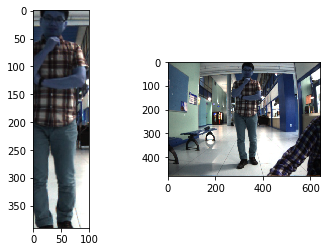

Epoch 1/1
80/80 [==============================] - 0s 577us/step - loss: 0.0113 - acc: 1.0000
2
depth of current image  1.1488492780908084
depth of previous image  1.0278850176300072
27695
0.7101282051282052
predicted_value  [0.99867344]
cordis are  [23, 301]


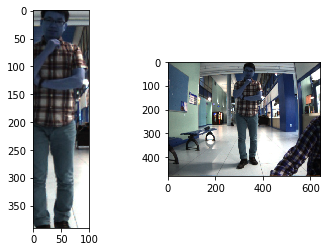

Epoch 1/1
80/80 [==============================] - 0s 124us/step - loss: 0.0196 - acc: 1.0000
3
depth of current image  1.2182452448217025
depth of previous image  1.1488492780908084
27922
0.715948717948718
predicted_value  [0.9988136]
cordis are  [23, 301]


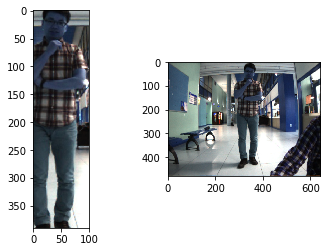

Epoch 1/1
80/80 [==============================] - 0s 119us/step - loss: 0.0417 - acc: 0.9875
4
depth of current image  1.2806316620608302
depth of previous image  1.2182452448217025
28629
0.7340769230769231
predicted_value  [0.9985261]
cordis are  [23, 306]


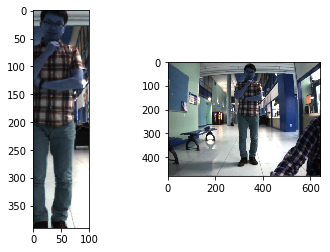

Epoch 1/1
80/80 [==============================] - 0s 130us/step - loss: 0.0090 - acc: 1.0000
5
depth of current image  1.316353089908404
depth of previous image  1.2806316620608302
26735
0.6855128205128205
predicted_value  [0.9991295]
cordis are  [28, 306]


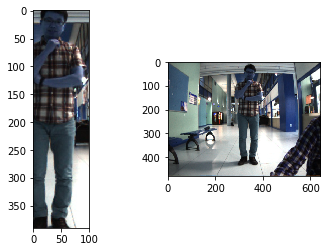

Epoch 1/1
80/80 [==============================] - 0s 120us/step - loss: 0.0622 - acc: 0.9750
6
depth of current image  1.3512147570484168
depth of previous image  1.316353089908404
26764
0.6862564102564103
predicted_value  [0.9977709]
cordis are  [18, 301]


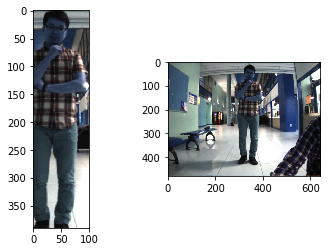

Epoch 1/1
80/80 [==============================] - 0s 127us/step - loss: 0.0221 - acc: 1.0000
7
depth of current image  1.371050066670347
depth of previous image  1.3512147570484168
27060
0.6938461538461539
predicted_value  [0.99863225]
cordis are  [23, 306]


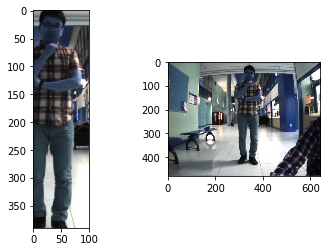

Epoch 1/1
80/80 [==============================] - 0s 126us/step - loss: 0.0746 - acc: 0.9750
8
depth of current image  1.3911281484527804
depth of previous image  1.371050066670347
25416
0.6516923076923077
predicted_value  [0.9976413]
cordis are  [18, 301]


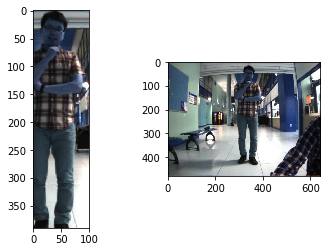

Epoch 1/1
80/80 [==============================] - 0s 126us/step - loss: 0.0234 - acc: 1.0000
9
depth of current image  1.408980309502333
depth of previous image  1.3911281484527804
26009
0.6668974358974359
predicted_value  [0.9950294]
cordis are  [33, 296]


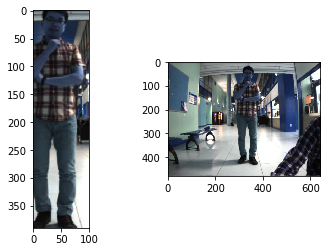

Epoch 1/1
80/80 [==============================] - 0s 135us/step - loss: 0.0338 - acc: 1.0000
10
depth of current image  1.4326639161011723
depth of previous image  1.408980309502333
27758
0.7117435897435898
predicted_value  [0.9932794]
cordis are  [33, 296]


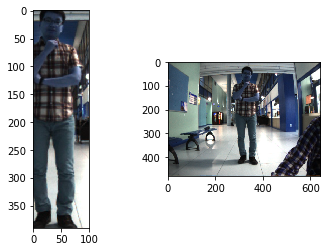

Epoch 1/1
80/80 [==============================] - 0s 120us/step - loss: 0.0424 - acc: 1.0000
11
depth of current image  1.4354445669528977
depth of previous image  1.4326639161011723
27369
0.7017692307692308
predicted_value  [0.99790573]
cordis are  [23, 296]


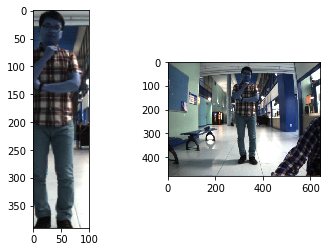

Epoch 1/1
80/80 [==============================] - 0s 125us/step - loss: 0.0240 - acc: 0.9875
12
depth of current image  1.4378700262845756
depth of previous image  1.4354445669528977
25960
0.6656410256410257
predicted_value  [0.9971902]
cordis are  [33, 291]


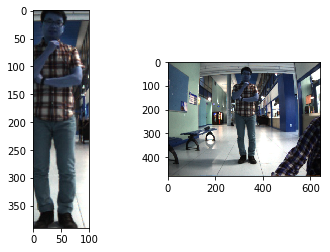

Epoch 1/1
80/80 [==============================] - 0s 123us/step - loss: 0.0074 - acc: 1.0000
13
depth of current image  1.457023953585261
depth of previous image  1.4378700262845756
27902
0.7154358974358974
predicted_value  [0.9989336]
cordis are  [33, 291]


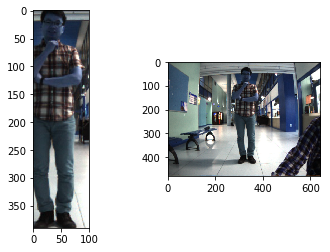

Epoch 1/1
80/80 [==============================] - 0s 123us/step - loss: 0.0069 - acc: 1.0000
14
depth of current image  1.4607164869677345
depth of previous image  1.457023953585261
27868
0.7145641025641025
predicted_value  [0.99874204]
cordis are  [33, 291]


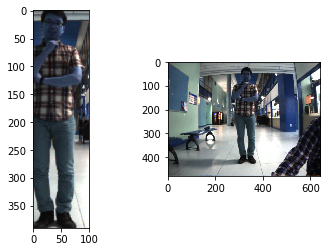

Epoch 1/1
80/80 [==============================] - 0s 123us/step - loss: 0.0197 - acc: 0.9875
15
depth of current image  1.4655612863754404
depth of previous image  1.4607164869677345
27885
0.715
predicted_value  [0.99929106]
cordis are  [23, 291]


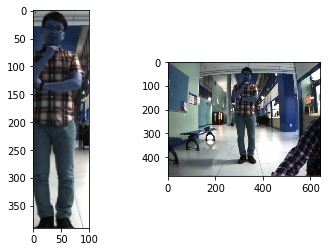

Epoch 1/1
80/80 [==============================] - 0s 132us/step - loss: 0.0307 - acc: 0.9875
16
depth of current image  1.4645128652720276
depth of previous image  1.4655612863754404
27093
0.6946923076923077
predicted_value  [0.99918085]
cordis are  [33, 291]


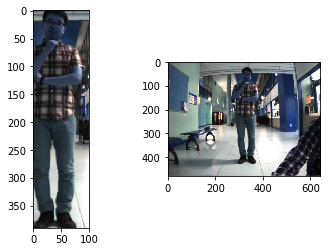

Epoch 1/1
80/80 [==============================] - 0s 114us/step - loss: 0.0197 - acc: 0.9875
17
depth of current image  1.4675324892535466
depth of previous image  1.4645128652720276
28136
0.7214358974358974
predicted_value  [0.99905914]
cordis are  [33, 291]


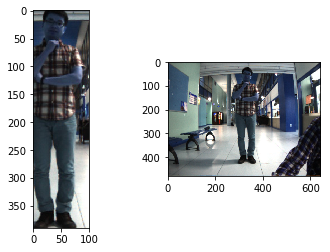

Epoch 1/1
80/80 [==============================] - 0s 118us/step - loss: 0.0080 - acc: 1.0000
18
depth of current image  1.4690833180641996
depth of previous image  1.4675324892535466
28659
0.7348461538461538
predicted_value  [0.9993291]
cordis are  [33, 291]


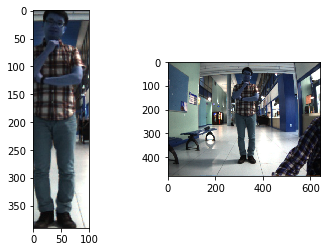

Epoch 1/1
80/80 [==============================] - 0s 115us/step - loss: 0.0662 - acc: 0.9750
19
depth of current image  1.4733304093265716
depth of previous image  1.4690833180641996
28835
0.7393589743589744
predicted_value  [0.9993855]
cordis are  [23, 296]


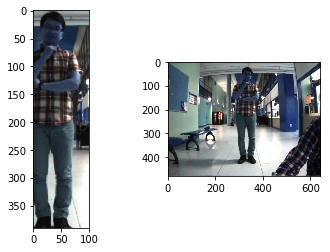

Epoch 1/1
80/80 [==============================] - 0s 131us/step - loss: 0.0362 - acc: 0.9875
20
depth of current image  1.4721247007099878
depth of previous image  1.4733304093265716
26386
0.6765641025641026
predicted_value  [0.9989102]
cordis are  [23, 296]


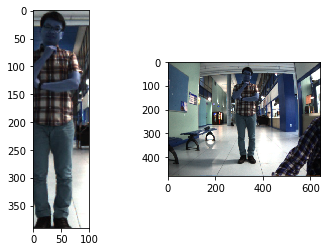

Epoch 1/1
80/80 [==============================] - 0s 116us/step - loss: 0.0385 - acc: 0.9875
21
depth of current image  1.4725125588956096
depth of previous image  1.4721247007099878
26405
0.6770512820512821
predicted_value  [0.99900097]
cordis are  [23, 296]


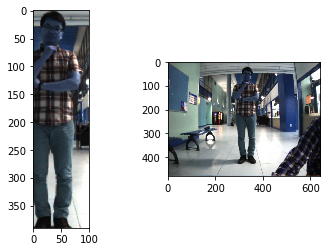

Epoch 1/1
80/80 [==============================] - 0s 138us/step - loss: 0.0228 - acc: 1.0000
22
depth of current image  1.4718538432679658
depth of previous image  1.4725125588956096
26344
0.6754871794871795
predicted_value  [0.99919647]
cordis are  [23, 296]


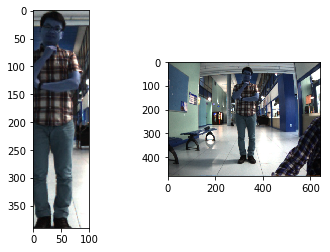

Epoch 1/1
80/80 [==============================] - 0s 130us/step - loss: 0.0202 - acc: 1.0000
23
depth of current image  1.4729890771300485
depth of previous image  1.4718538432679658
26329
0.6751025641025641
predicted_value  [0.999326]
cordis are  [23, 296]


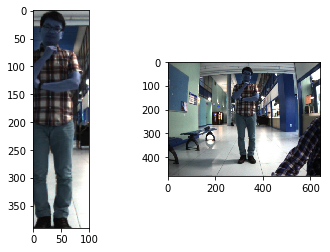

Epoch 1/1
80/80 [==============================] - 0s 123us/step - loss: 0.0119 - acc: 1.0000
24
depth of current image  1.4723342546070228
depth of previous image  1.4729890771300485
26285
0.673974358974359
predicted_value  [0.999705]
cordis are  [23, 296]


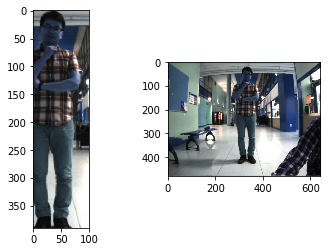

Epoch 1/1
80/80 [==============================] - 0s 131us/step - loss: 0.0215 - acc: 1.0000
25
depth of current image  1.470515073919436
depth of previous image  1.4723342546070228
26372
0.6762051282051282
predicted_value  [0.9998729]
cordis are  [23, 296]


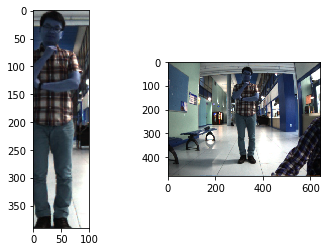

Epoch 1/1
80/80 [==============================] - 0s 123us/step - loss: 0.0633 - acc: 0.9875
26
depth of current image  1.4691804467845755
depth of previous image  1.470515073919436
26274
0.6736923076923077
predicted_value  [0.9998592]
cordis are  [23, 296]


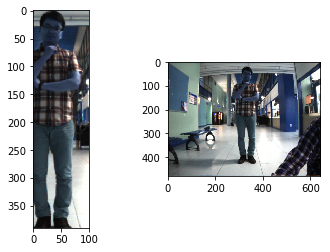

Epoch 1/1
80/80 [==============================] - 0s 121us/step - loss: 0.0102 - acc: 1.0000
27
depth of current image  1.4668679496579666
depth of previous image  1.4691804467845755
26038
0.6676410256410257
predicted_value  [0.9997625]
cordis are  [18, 296]


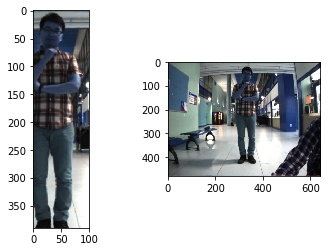

Epoch 1/1
80/80 [==============================] - 0s 122us/step - loss: 0.0036 - acc: 1.0000
28
depth of current image  1.4617012272532461
depth of previous image  1.4668679496579666
25854
0.662923076923077
predicted_value  [0.9998745]
cordis are  [18, 296]


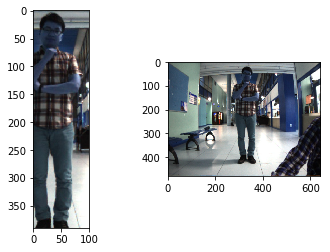

Epoch 1/1
80/80 [==============================] - 0s 127us/step - loss: 0.0074 - acc: 1.0000
29
depth of current image  1.4614475090381291
depth of previous image  1.4617012272532461
25870
0.6633333333333333
predicted_value  [0.9998708]
cordis are  [18, 296]


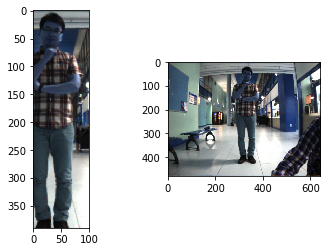

Epoch 1/1
80/80 [==============================] - 0s 124us/step - loss: 0.0283 - acc: 0.9875
30
depth of current image  1.4620374317042846
depth of previous image  1.4614475090381291
25807
0.6617179487179488
predicted_value  [0.99975544]
cordis are  [23, 296]


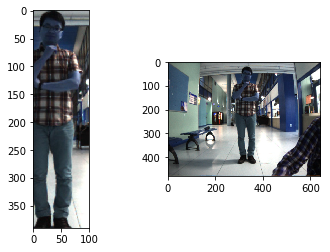

Epoch 1/1
80/80 [==============================] - 0s 131us/step - loss: 0.0371 - acc: 0.9875
31
depth of current image  1.4675989635521647
depth of previous image  1.4620374317042846
26357
0.6758205128205128
predicted_value  [0.9998858]
cordis are  [18, 296]


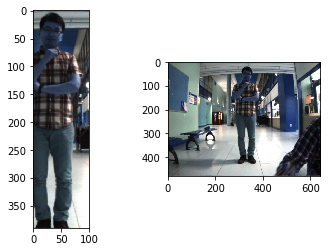

Epoch 1/1
80/80 [==============================] - 0s 115us/step - loss: 0.0237 - acc: 0.9875
32
depth of current image  1.4629173059865241
depth of previous image  1.4675989635521647
25801
0.6615641025641026
predicted_value  [0.99977034]
cordis are  [28, 296]


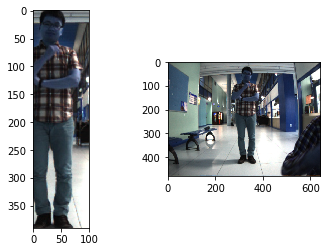

Epoch 1/1
80/80 [==============================] - 0s 129us/step - loss: 0.0205 - acc: 1.0000
33
depth of current image  1.4631958226382171
depth of previous image  1.4629173059865241
26676
0.684
predicted_value  [0.9997912]
cordis are  [18, 296]


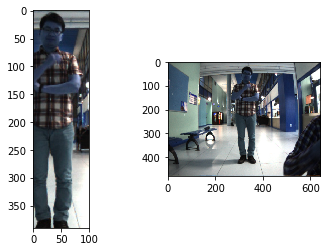

Epoch 1/1
80/80 [==============================] - 0s 137us/step - loss: 0.0154 - acc: 1.0000
34
depth of current image  1.4643305668594027
depth of previous image  1.4631958226382171
26033
0.6675128205128205
predicted_value  [0.99988616]
cordis are  [23, 296]


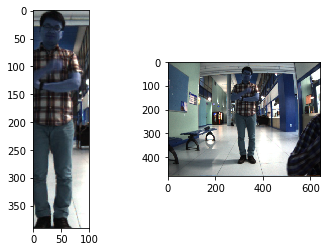

Epoch 1/1
80/80 [==============================] - 0s 117us/step - loss: 0.0809 - acc: 0.9750
35
depth of current image  1.467668692462513
depth of previous image  1.4643305668594027
26598
0.682
predicted_value  [0.99988115]
cordis are  [23, 296]


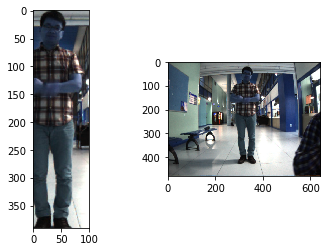

Epoch 1/1
80/80 [==============================] - 0s 120us/step - loss: 0.0219 - acc: 1.0000
36
depth of current image  1.4670920089362196
depth of previous image  1.467668692462513
26945
0.6908974358974359
predicted_value  [0.9999187]
cordis are  [23, 296]


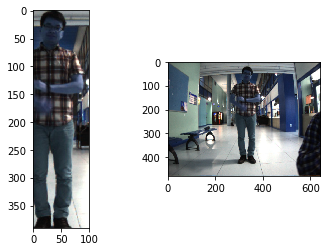

Epoch 1/1
80/80 [==============================] - 0s 125us/step - loss: 0.0096 - acc: 1.0000
37
depth of current image  1.4647412463303495
depth of previous image  1.4670920089362196
27113
0.6952051282051283
predicted_value  [0.9999474]
cordis are  [23, 296]


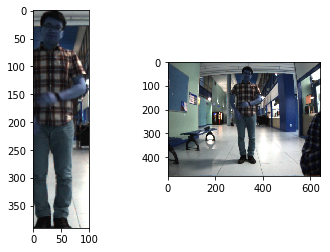

Epoch 1/1
80/80 [==============================] - 0s 183us/step - loss: 0.0182 - acc: 0.9875
38
depth of current image  1.4616223752747801
depth of previous image  1.4647412463303495
27339
0.701
predicted_value  [0.99988246]
cordis are  [23, 296]


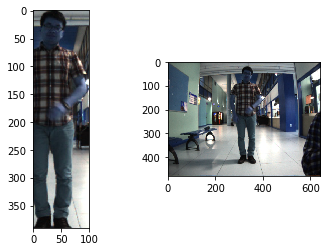

Epoch 1/1
80/80 [==============================] - 0s 122us/step - loss: 0.0111 - acc: 1.0000
39
depth of current image  1.459179830481564
depth of previous image  1.4616223752747801
27802
0.7128717948717949
predicted_value  [0.9997857]
cordis are  [23, 296]


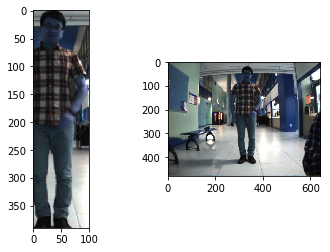

Epoch 1/1
80/80 [==============================] - 0s 134us/step - loss: 0.0060 - acc: 1.0000
40
depth of current image  1.457411067193365
depth of previous image  1.459179830481564
28336
0.7265641025641025
predicted_value  [0.99920255]
cordis are  [23, 296]


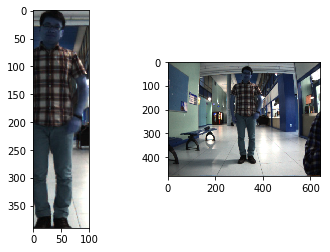

Epoch 1/1
80/80 [==============================] - 0s 125us/step - loss: 0.0046 - acc: 1.0000
41
depth of current image  1.4587889841849755
depth of previous image  1.457411067193365
28607
0.7335128205128205
predicted_value  [0.9997707]
cordis are  [23, 296]


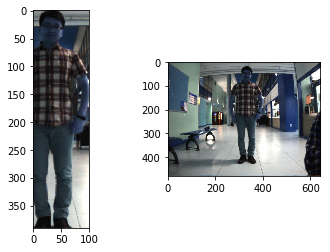

Epoch 1/1
80/80 [==============================] - 0s 195us/step - loss: 0.0470 - acc: 0.9750
42
depth of current image  1.4602997686181318
depth of previous image  1.4587889841849755
28626
0.734
predicted_value  [0.9995869]
cordis are  [28, 296]


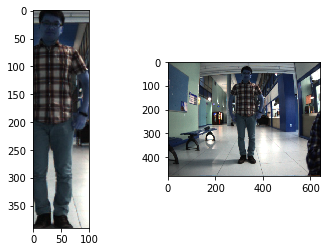

Epoch 1/1
80/80 [==============================] - 0s 132us/step - loss: 0.0073 - acc: 1.0000
43
depth of current image  1.4601266237485537
depth of previous image  1.4602997686181318
28728
0.7366153846153846
predicted_value  [0.99970895]
cordis are  [38, 296]


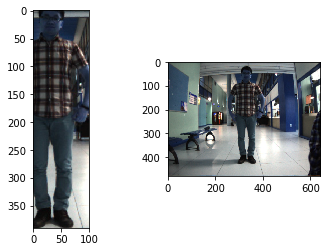

Epoch 1/1
80/80 [==============================] - 0s 127us/step - loss: 0.0062 - acc: 1.0000
44
depth of current image  1.4595021692233618
depth of previous image  1.4601266237485537
29124
0.7467692307692307
predicted_value  [0.9998939]
cordis are  [23, 296]


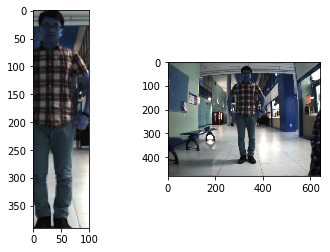

Epoch 1/1
80/80 [==============================] - 0s 138us/step - loss: 0.0106 - acc: 1.0000
45
depth of current image  1.4574396425233864
depth of previous image  1.4595021692233618
28224
0.7236923076923077
predicted_value  [0.9999348]
cordis are  [18, 296]


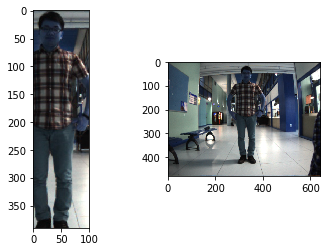

Epoch 1/1
80/80 [==============================] - 0s 118us/step - loss: 0.0049 - acc: 1.0000
46
depth of current image  1.4562204119205993
depth of previous image  1.4574396425233864
27858
0.7143076923076923
predicted_value  [0.99991393]
cordis are  [28, 296]


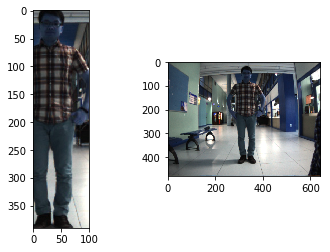

Epoch 1/1
80/80 [==============================] - 0s 123us/step - loss: 0.0061 - acc: 1.0000
47
depth of current image  1.4582597295480395
depth of previous image  1.4562204119205993
28671
0.7351538461538462
predicted_value  [0.99992704]
cordis are  [23, 296]


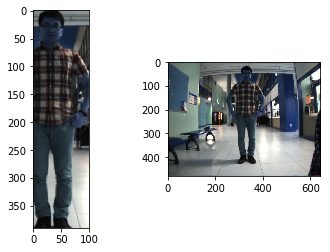

Epoch 1/1
80/80 [==============================] - 0s 134us/step - loss: 0.0447 - acc: 0.9750
48
depth of current image  1.4549483215663876
depth of previous image  1.4582597295480395
28337
0.7265897435897436
predicted_value  [0.9998783]
cordis are  [23, 296]


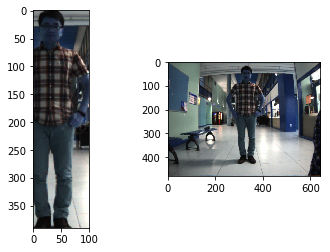

Epoch 1/1
80/80 [==============================] - 0s 121us/step - loss: 0.0151 - acc: 1.0000
49
depth of current image  1.453329940683971
depth of previous image  1.4549483215663876
28204
0.7231794871794872
predicted_value  [0.9999496]
cordis are  [23, 296]


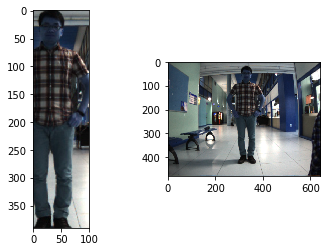

Epoch 1/1
80/80 [==============================] - 0s 120us/step - loss: 0.0039 - acc: 1.0000
50
depth of current image  1.4545572581266741
depth of previous image  1.453329940683971
28089
0.7202307692307692
predicted_value  [0.9999033]
cordis are  [23, 296]


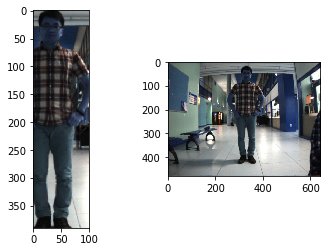

Epoch 1/1
80/80 [==============================] - 0s 127us/step - loss: 0.0123 - acc: 1.0000
51
depth of current image  1.4526725931527142
depth of previous image  1.4545572581266741
27990
0.7176923076923077
predicted_value  [0.9999114]
cordis are  [23, 296]


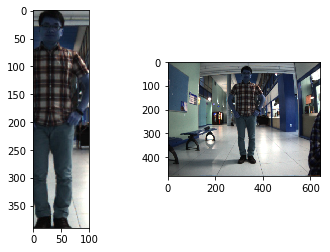

Epoch 1/1
80/80 [==============================] - 0s 111us/step - loss: 0.0033 - acc: 1.0000
52
depth of current image  1.4515827360906886
depth of previous image  1.4526725931527142
27865
0.7144871794871794
predicted_value  [0.9999316]
cordis are  [23, 296]


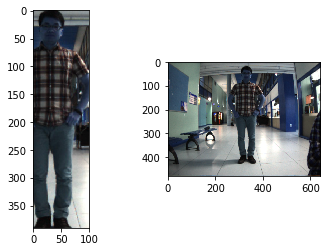

Epoch 1/1
80/80 [==============================] - 0s 131us/step - loss: 0.0055 - acc: 1.0000
53
depth of current image  1.4501548871293963
depth of previous image  1.4515827360906886
28028
0.7186666666666667
predicted_value  [0.9999052]
cordis are  [23, 296]


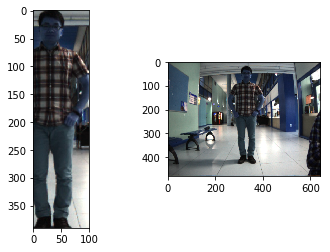

Epoch 1/1
80/80 [==============================] - 0s 121us/step - loss: 0.0307 - acc: 1.0000
54
depth of current image  1.4501321174633695
depth of previous image  1.4501548871293963
28228
0.7237948717948718
predicted_value  [0.99984133]
cordis are  [18, 296]


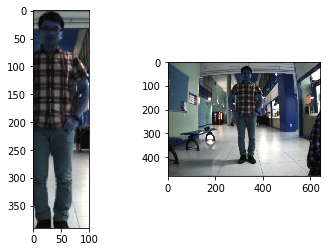

Epoch 1/1
80/80 [==============================] - 0s 115us/step - loss: 0.0050 - acc: 1.0000
55
depth of current image  1.451819234837994
depth of previous image  1.4501321174633695
28134
0.7213846153846154
predicted_value  [0.9998629]
cordis are  [18, 296]


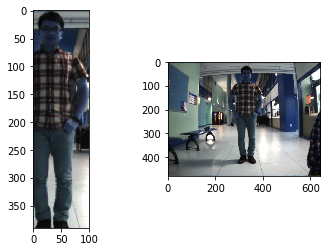

Epoch 1/1
80/80 [==============================] - 0s 127us/step - loss: 0.0079 - acc: 1.0000
56
depth of current image  1.4517130897299722
depth of previous image  1.451819234837994
28035
0.7188461538461538
predicted_value  [0.9997526]
cordis are  [18, 296]


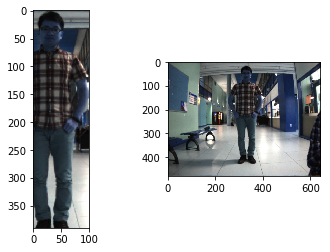

Epoch 1/1
80/80 [==============================] - 0s 115us/step - loss: 0.0106 - acc: 1.0000
57
depth of current image  1.452009642925829
depth of previous image  1.4517130897299722
28012
0.7182564102564103
predicted_value  [0.9998925]
cordis are  [18, 296]


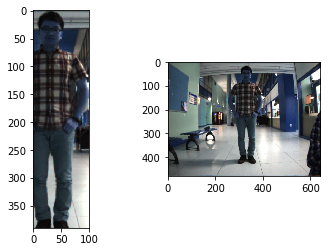

Epoch 1/1
80/80 [==============================] - 0s 122us/step - loss: 0.0055 - acc: 1.0000
58
depth of current image  1.4524306262899382
depth of previous image  1.452009642925829
28009
0.7181794871794872
predicted_value  [0.9998246]
cordis are  [18, 296]


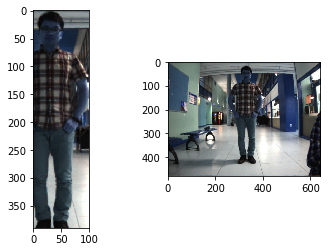

Epoch 1/1
80/80 [==============================] - 0s 116us/step - loss: 0.0050 - acc: 1.0000
59
depth of current image  1.4524870389008218
depth of previous image  1.4524306262899382
27991
0.7177179487179487
predicted_value  [0.999962]
cordis are  [23, 296]


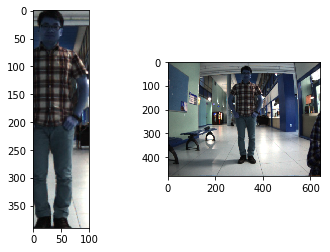

Epoch 1/1
80/80 [==============================] - 0s 116us/step - loss: 9.7714e-04 - acc: 1.0000
60
depth of current image  1.4515990268322898
depth of previous image  1.4524870389008218
28361
0.7272051282051282
predicted_value  [0.9999505]
cordis are  [18, 296]


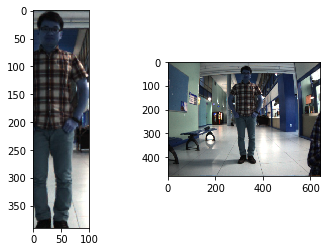

Epoch 1/1
80/80 [==============================] - 0s 116us/step - loss: 0.0113 - acc: 0.9875
61
depth of current image  1.449697214797106
depth of previous image  1.4515990268322898
27994
0.7177948717948718
predicted_value  [0.9999702]
cordis are  [18, 296]


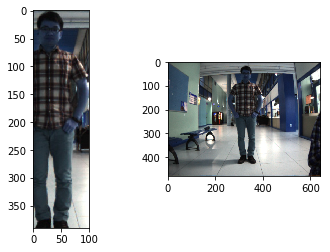

Epoch 1/1
80/80 [==============================] - 0s 126us/step - loss: 7.6855e-04 - acc: 1.0000
62
depth of current image  1.4485277821580977
depth of previous image  1.449697214797106
27975
0.7173076923076923
predicted_value  [0.9999715]
cordis are  [18, 296]


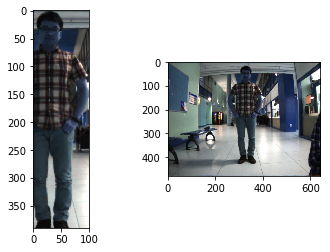

Epoch 1/1
80/80 [==============================] - 0s 121us/step - loss: 8.5456e-04 - acc: 1.0000
63
depth of current image  1.4474700065307349
depth of previous image  1.4485277821580977
28011
0.7182307692307692
predicted_value  [0.9999771]
cordis are  [18, 296]


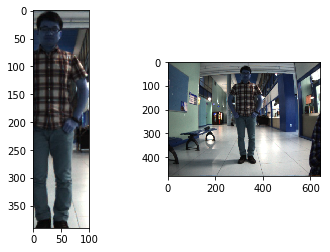

Epoch 1/1
80/80 [==============================] - 0s 123us/step - loss: 0.0468 - acc: 0.9875
64
depth of current image  1.448027999349883
depth of previous image  1.4474700065307349
27883
0.714948717948718
predicted_value  [0.99995434]
cordis are  [18, 296]


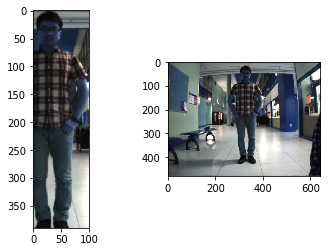

Epoch 1/1
80/80 [==============================] - 0s 153us/step - loss: 0.0014 - acc: 1.0000
65
depth of current image  1.4447559790248852
depth of previous image  1.448027999349883
27899
0.7153589743589743
predicted_value  [0.99981815]
cordis are  [18, 296]


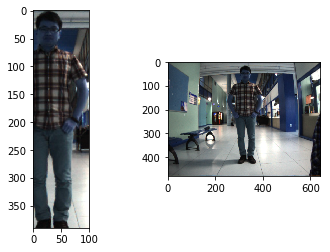

Epoch 1/1
80/80 [==============================] - 0s 121us/step - loss: 0.0020 - acc: 1.0000
66
depth of current image  1.4429157611165695
depth of previous image  1.4447559790248852
27647
0.7088974358974359
predicted_value  [0.9998286]
cordis are  [18, 291]


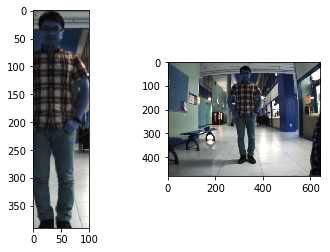

Epoch 1/1
80/80 [==============================] - 0s 114us/step - loss: 0.0011 - acc: 1.0000
67
depth of current image  1.4424010067009183
depth of previous image  1.4429157611165695
29029
0.7443333333333333
predicted_value  [0.9999393]
cordis are  [23, 291]


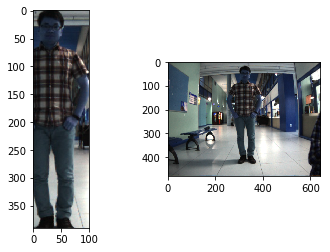

Epoch 1/1
80/80 [==============================] - 0s 128us/step - loss: 0.0156 - acc: 0.9875
68
depth of current image  1.4331476087452484
depth of previous image  1.4424010067009183
29202
0.7487692307692307
predicted_value  [0.99995375]
cordis are  [18, 291]


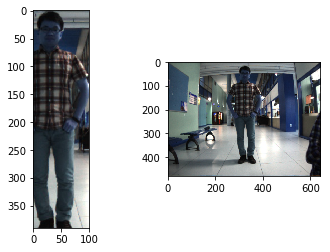

Epoch 1/1
80/80 [==============================] - 0s 130us/step - loss: 0.0060 - acc: 1.0000
69
depth of current image  1.4262266580546523
depth of previous image  1.4331476087452484
29028
0.7443076923076923
predicted_value  [0.9999156]
cordis are  [18, 291]


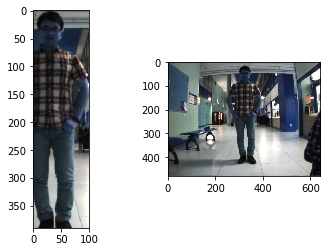

Epoch 1/1
80/80 [==============================] - 0s 126us/step - loss: 0.0073 - acc: 1.0000
70
depth of current image  1.4066491999287418
depth of previous image  1.4262266580546523
29350
0.7525641025641026
predicted_value  [0.999874]
cordis are  [23, 291]


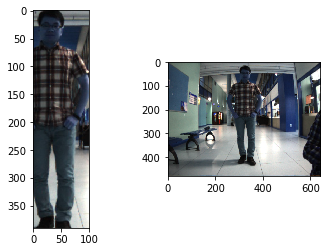

Epoch 1/1
80/80 [==============================] - 0s 116us/step - loss: 0.0066 - acc: 1.0000
71
depth of current image  1.3960455329637012
depth of previous image  1.4066491999287418
29902
0.7667179487179487
predicted_value  [0.9997733]
cordis are  [23, 291]


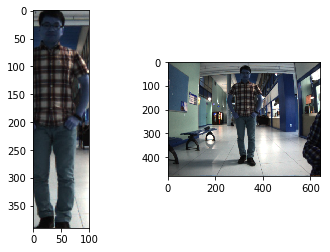

Epoch 1/1
80/80 [==============================] - 0s 131us/step - loss: 0.0111 - acc: 1.0000
72
depth of current image  1.3795593464566116
depth of previous image  1.3960455329637012
30372
0.7787692307692308
predicted_value  [0.99998033]
cordis are  [23, 296]


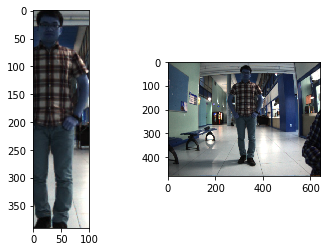

Epoch 1/1
80/80 [==============================] - 0s 120us/step - loss: 0.0858 - acc: 0.9875
73
depth of current image  1.3625465835999961
depth of previous image  1.3795593464566116
29052
0.7449230769230769
predicted_value  [0.99997675]
cordis are  [23, 296]


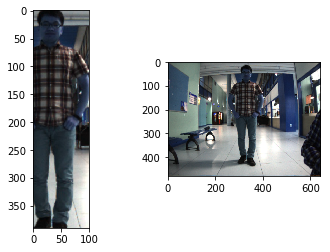

Epoch 1/1
80/80 [==============================] - 0s 129us/step - loss: 0.0042 - acc: 1.0000
74
depth of current image  1.3395929731310343
depth of previous image  1.3625465835999961
29630
0.7597435897435898
predicted_value  [0.9999832]
cordis are  [23, 296]


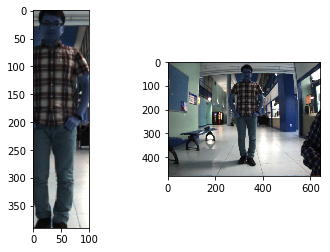

Epoch 1/1
80/80 [==============================] - 0s 120us/step - loss: 0.0412 - acc: 0.9875
75
depth of current image  1.3213561286582232
depth of previous image  1.3395929731310343
29735
0.7624358974358975
predicted_value  [0.9999876]
cordis are  [23, 296]


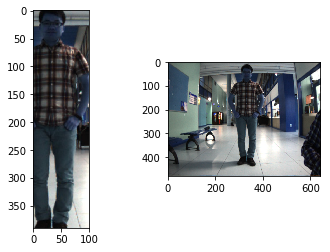

Epoch 1/1
80/80 [==============================] - 0s 125us/step - loss: 0.0051 - acc: 1.0000
76
depth of current image  1.3042545147533298
depth of previous image  1.3213561286582232
30061
0.7707948717948718
predicted_value  [0.99998593]
cordis are  [23, 296]


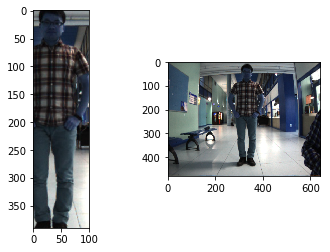

Epoch 1/1
80/80 [==============================] - 0s 125us/step - loss: 0.0044 - acc: 1.0000
77
depth of current image  1.2915335237615608
depth of previous image  1.3042545147533298
29819
0.7645897435897436
predicted_value  [0.9999708]
cordis are  [23, 296]


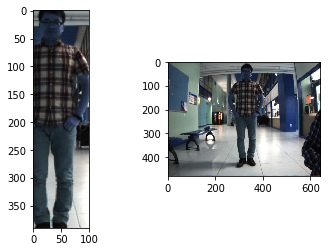

Epoch 1/1
80/80 [==============================] - 0s 155us/step - loss: 0.0023 - acc: 1.0000
78
depth of current image  1.2703235004188478
depth of previous image  1.2915335237615608
29331
0.7520769230769231
predicted_value  [0.99991834]
cordis are  [23, 296]


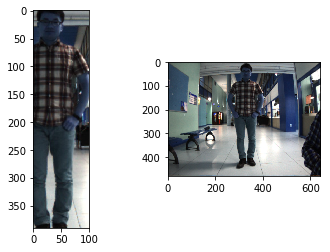

Epoch 1/1
80/80 [==============================] - 0s 121us/step - loss: 0.0147 - acc: 0.9875
79
depth of current image  1.2575611977041348
depth of previous image  1.2703235004188478
29224
0.7493333333333333
predicted_value  [0.99994624]
cordis are  [23, 291]


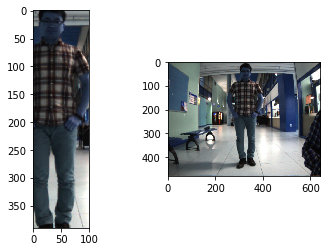

Epoch 1/1
80/80 [==============================] - 0s 123us/step - loss: 0.0038 - acc: 1.0000
80
depth of current image  1.2425603283885582
depth of previous image  1.2575611977041348
30542
0.7831282051282051
predicted_value  [0.9999064]
cordis are  [23, 291]


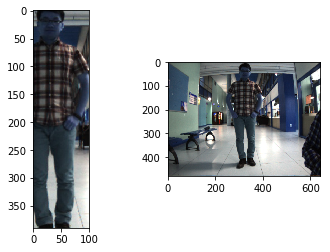

Epoch 1/1
80/80 [==============================] - 0s 128us/step - loss: 0.0077 - acc: 1.0000
81
depth of current image  1.2217972472207002
depth of previous image  1.2425603283885582
30101
0.7718205128205128
predicted_value  [0.99983096]
cordis are  [23, 291]


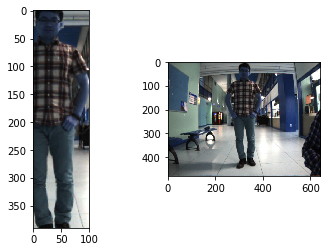

Epoch 1/1
80/80 [==============================] - 0s 121us/step - loss: 0.0111 - acc: 1.0000
82
depth of current image  1.208531108405388
depth of previous image  1.2217972472207002
29370
0.7530769230769231
predicted_value  [0.9997484]
cordis are  [23, 286]


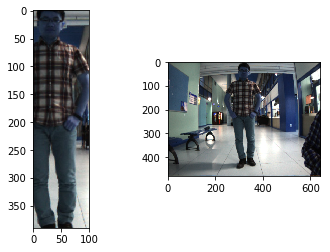

Epoch 1/1
80/80 [==============================] - 0s 135us/step - loss: 0.0044 - acc: 1.0000
83
depth of current image  1.1918550854844612
depth of previous image  1.208531108405388
30642
0.7856923076923077
predicted_value  [0.9999285]
cordis are  [23, 286]


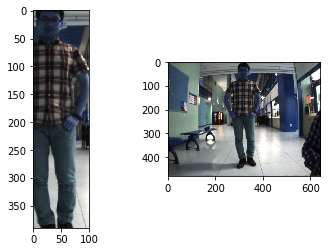

Epoch 1/1
80/80 [==============================] - 0s 124us/step - loss: 0.0053 - acc: 1.0000
84
depth of current image  1.1777036109952932
depth of previous image  1.1918550854844612
30314
0.7772820512820513
predicted_value  [0.9998851]
cordis are  [18, 286]


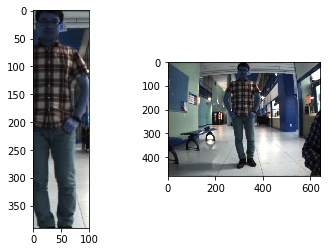

Epoch 1/1
80/80 [==============================] - 0s 118us/step - loss: 0.0029 - acc: 1.0000
85
depth of current image  1.1608142090339697
depth of previous image  1.1777036109952932
30057
0.7706923076923077
predicted_value  [0.9998958]
cordis are  [18, 286]


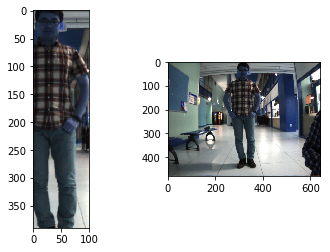

Epoch 1/1
80/80 [==============================] - 0s 133us/step - loss: 0.0027 - acc: 1.0000
86
depth of current image  1.1570683913410722
depth of previous image  1.1608142090339697
30187
0.774025641025641
predicted_value  [0.9999156]
cordis are  [23, 286]


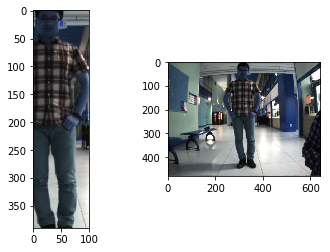

Epoch 1/1
80/80 [==============================] - 0s 127us/step - loss: 0.0104 - acc: 0.9875
87
depth of current image  1.1540637556721598
depth of previous image  1.1570683913410722
31021
0.7954102564102564
predicted_value  [0.9998486]
cordis are  [18, 286]


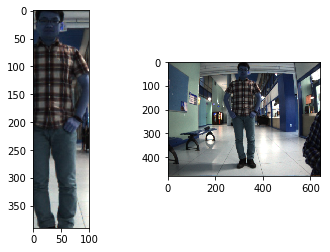

Epoch 1/1
80/80 [==============================] - 0s 121us/step - loss: 0.0025 - acc: 1.0000
88
depth of current image  1.1479063404089127
depth of previous image  1.1540637556721598
31129
0.7981794871794872
predicted_value  [0.9999113]
cordis are  [18, 286]


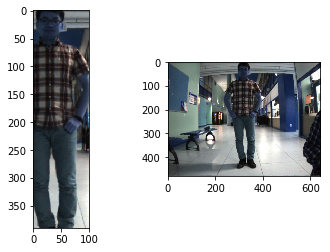

Epoch 1/1
80/80 [==============================] - 0s 122us/step - loss: 0.0122 - acc: 0.9875
89
depth of current image  1.1486112445228804
depth of previous image  1.1479063404089127
31844
0.8165128205128205
predicted_value  [0.9997851]
cordis are  [18, 286]


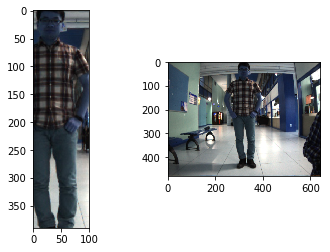

Epoch 1/1
80/80 [==============================] - 0s 114us/step - loss: 0.0050 - acc: 1.0000
90
depth of current image  1.147387086833788
depth of previous image  1.1486112445228804
31879
0.8174102564102564
predicted_value  [0.9998087]
cordis are  [23, 291]


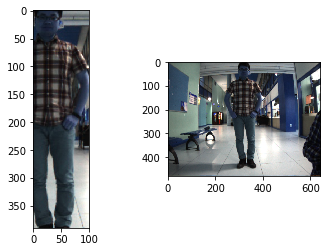

Epoch 1/1
80/80 [==============================] - 0s 121us/step - loss: 0.0066 - acc: 1.0000
91
depth of current image  1.1469105386906981
depth of previous image  1.147387086833788
30347
0.7781282051282051
predicted_value  [0.9999089]
cordis are  [23, 291]


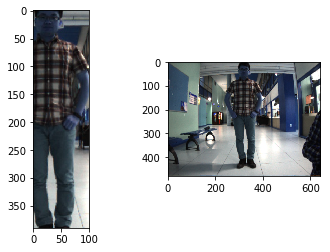

Epoch 1/1
80/80 [==============================] - 0s 130us/step - loss: 0.0078 - acc: 1.0000
92
depth of current image  1.148383070768135
depth of previous image  1.1469105386906981
30730
0.7879487179487179
predicted_value  [0.99997723]
cordis are  [28, 291]


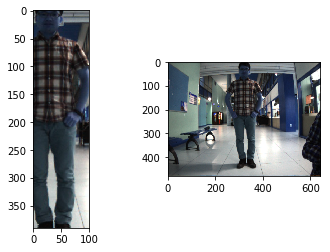

Epoch 1/1
80/80 [==============================] - 0s 137us/step - loss: 0.0061 - acc: 1.0000
93
depth of current image  1.1470291300573767
depth of previous image  1.148383070768135
30904
0.7924102564102564
predicted_value  [0.99998593]
cordis are  [18, 291]


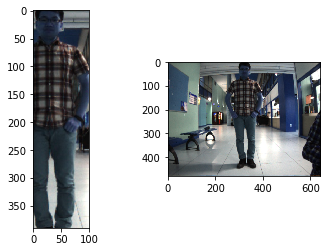

Epoch 1/1
80/80 [==============================] - 0s 120us/step - loss: 0.0014 - acc: 1.0000
94
depth of current image  1.143458238068299
depth of previous image  1.1470291300573767
31011
0.7951538461538461
predicted_value  [0.9999801]
cordis are  [18, 291]


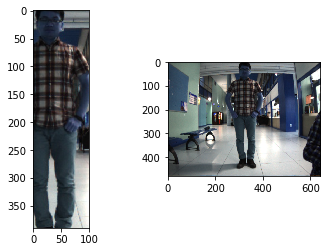

Epoch 1/1
80/80 [==============================] - 0s 155us/step - loss: 0.0098 - acc: 1.0000
95
depth of current image  1.1398958169975921
depth of previous image  1.143458238068299
31133
0.7982820512820513
predicted_value  [0.9999908]
cordis are  [18, 291]


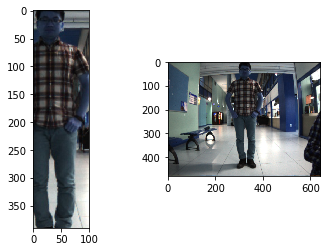

Epoch 1/1
80/80 [==============================] - 0s 117us/step - loss: 0.0070 - acc: 1.0000
96
depth of current image  1.1402092653053595
depth of previous image  1.1398958169975921
31151
0.7987435897435897
predicted_value  [0.99998236]
cordis are  [28, 291]


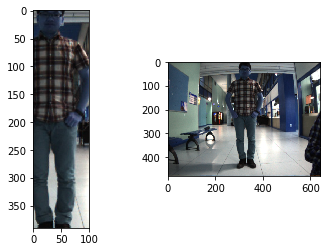

Epoch 1/1
80/80 [==============================] - 0s 125us/step - loss: 0.0021 - acc: 1.0000
97
depth of current image  1.143288122940218
depth of previous image  1.1402092653053595
31361
0.8041282051282052
predicted_value  [0.9999876]
cordis are  [18, 291]


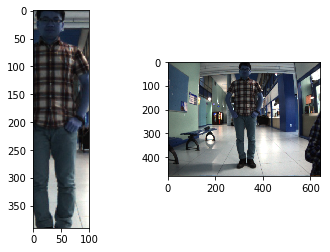

Epoch 1/1
80/80 [==============================] - 0s 124us/step - loss: 0.0798 - acc: 0.9750
98
depth of current image  1.1432686505720817
depth of previous image  1.143288122940218
31293
0.8023846153846154
predicted_value  [0.99998033]
cordis are  [28, 291]


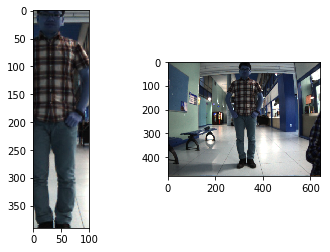

Epoch 1/1
80/80 [==============================] - 0s 119us/step - loss: 0.0050 - acc: 1.0000
99
depth of current image  1.1453045360087795
depth of previous image  1.1432686505720817
31225
0.8006410256410257
predicted_value  [0.99994767]
cordis are  [18, 291]


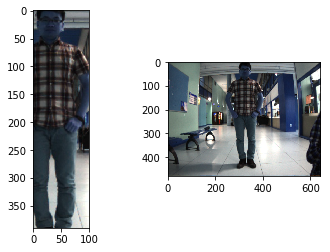

Epoch 1/1
80/80 [==============================] - 0s 131us/step - loss: 0.0324 - acc: 0.9875
100
depth of current image  1.143631026744153
depth of previous image  1.1453045360087795
31209
0.8002307692307692
predicted_value  [0.99995697]
cordis are  [18, 291]


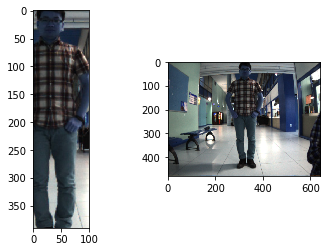

Epoch 1/1
80/80 [==============================] - 0s 144us/step - loss: 0.0370 - acc: 1.0000
101
depth of current image  1.1418996519830231
depth of previous image  1.143631026744153
31202
0.8000512820512821
predicted_value  [0.99998033]
cordis are  [18, 291]


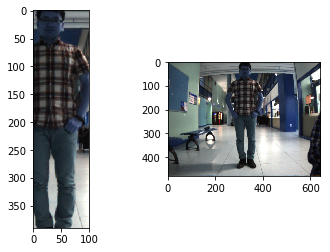

Epoch 1/1
80/80 [==============================] - 0s 119us/step - loss: 0.0052 - acc: 1.0000
102
depth of current image  1.1438405395087228
depth of previous image  1.1418996519830231
31279
0.802025641025641
predicted_value  [0.9999918]
cordis are  [18, 291]


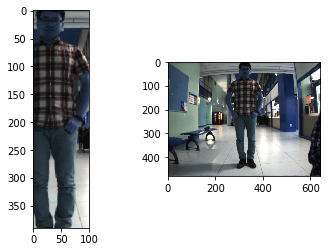

Epoch 1/1
80/80 [==============================] - 0s 127us/step - loss: 0.0260 - acc: 0.9875
103
depth of current image  1.1437608287782217
depth of previous image  1.1438405395087228
31133
0.7982820512820513
predicted_value  [0.999995]
cordis are  [18, 291]


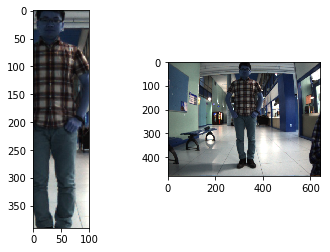

Epoch 1/1
80/80 [==============================] - 0s 130us/step - loss: 0.0031 - acc: 1.0000
104
depth of current image  1.1411670373913096
depth of previous image  1.1437608287782217
31179
0.7994615384615384
predicted_value  [0.9999958]
cordis are  [18, 291]


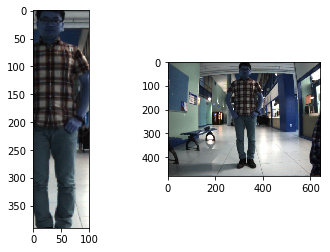

Epoch 1/1
80/80 [==============================] - 0s 117us/step - loss: 4.8374e-04 - acc: 1.0000
105
depth of current image  1.1425349537412761
depth of previous image  1.1411670373913096
31142
0.7985128205128205
predicted_value  [0.9999968]
cordis are  [18, 291]


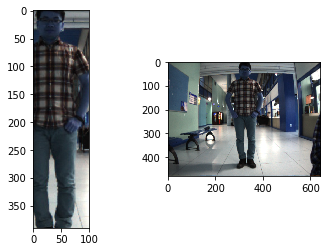

Epoch 1/1
80/80 [==============================] - 0s 134us/step - loss: 0.0013 - acc: 1.0000
106
depth of current image  1.1444165517033251
depth of previous image  1.1425349537412761
31053
0.7962307692307692
predicted_value  [0.9999968]
cordis are  [23, 291]


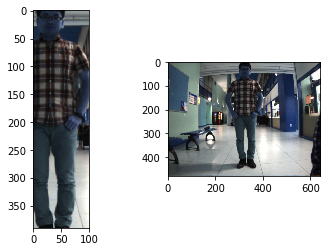

Epoch 1/1
80/80 [==============================] - 0s 116us/step - loss: 0.0828 - acc: 0.9750
107
depth of current image  1.145276492266498
depth of previous image  1.1444165517033251
31205
0.8001282051282051
predicted_value  [0.9999913]
cordis are  [23, 291]


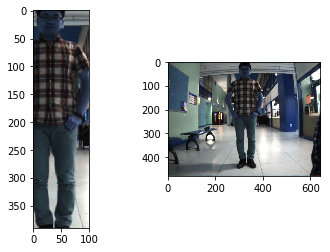

Epoch 1/1
80/80 [==============================] - 0s 115us/step - loss: 3.5368e-04 - acc: 1.0000
108
depth of current image  1.1451299545770823
depth of previous image  1.145276492266498
31210
0.8002564102564103
predicted_value  [0.99997973]
cordis are  [18, 291]


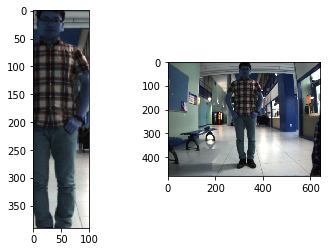

Epoch 1/1
80/80 [==============================] - 0s 120us/step - loss: 0.0772 - acc: 0.9875
109
depth of current image  1.1456868489274397
depth of previous image  1.1451299545770823
31063
0.7964871794871795
predicted_value  [0.99995196]
cordis are  [23, 291]


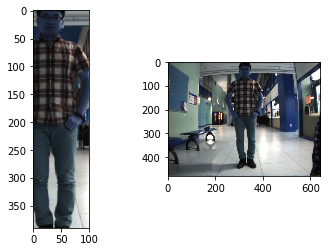

Epoch 1/1
80/80 [==============================] - 0s 119us/step - loss: 0.0024 - acc: 1.0000
110
depth of current image  1.1455420045788645
depth of previous image  1.1456868489274397
31269
0.8017692307692308
predicted_value  [0.99978215]
cordis are  [18, 291]


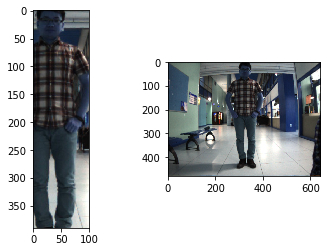

Epoch 1/1
80/80 [==============================] - 0s 120us/step - loss: 0.0115 - acc: 1.0000
111
depth of current image  1.1444446543470432
depth of previous image  1.1455420045788645
31138
0.7984102564102564
predicted_value  [0.9996481]
cordis are  [18, 291]


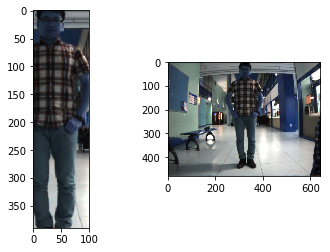

Epoch 1/1
80/80 [==============================] - 0s 116us/step - loss: 0.0269 - acc: 1.0000
112
depth of current image  1.1418023854267756
depth of previous image  1.1444446543470432
31309
0.8027948717948717
predicted_value  [0.99989176]
cordis are  [18, 291]


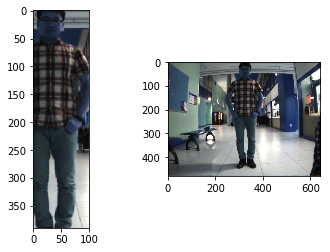

Epoch 1/1
80/80 [==============================] - 0s 116us/step - loss: 0.0667 - acc: 0.9875
113
depth of current image  1.1416997647058662
depth of previous image  1.1418023854267756
31250
0.8012820512820513
predicted_value  [0.9999244]
cordis are  [18, 291]


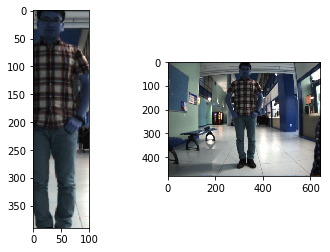

Epoch 1/1
80/80 [==============================] - 0s 131us/step - loss: 0.0039 - acc: 1.0000
114
depth of current image  1.1430244423104872
depth of previous image  1.1416997647058662
31303
0.8026410256410257
predicted_value  [0.9999647]
cordis are  [18, 291]


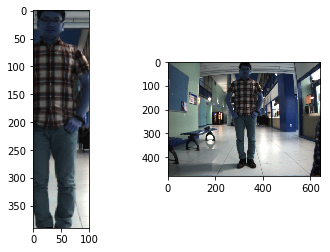

Epoch 1/1
80/80 [==============================] - 0s 123us/step - loss: 0.0012 - acc: 1.0000
115
depth of current image  1.142226292953397
depth of previous image  1.1430244423104872
31277
0.801974358974359
predicted_value  [0.9999813]
cordis are  [18, 291]


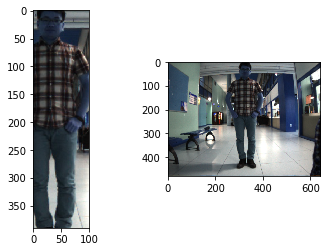

Epoch 1/1
80/80 [==============================] - 0s 118us/step - loss: 0.0422 - acc: 0.9875
116
depth of current image  1.1426589248360537
depth of previous image  1.142226292953397
31355
0.803974358974359
predicted_value  [0.99995923]
cordis are  [18, 291]


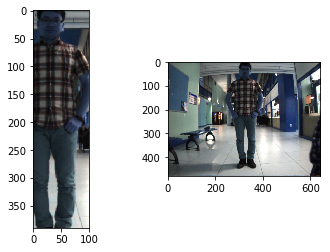

Epoch 1/1
80/80 [==============================] - 0s 117us/step - loss: 0.0639 - acc: 0.9875
117
depth of current image  1.1419611849975493
depth of previous image  1.1426589248360537
31319
0.8030512820512821
predicted_value  [0.9999559]
cordis are  [18, 291]


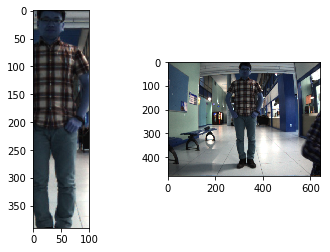

Epoch 1/1
80/80 [==============================] - 0s 122us/step - loss: 0.0034 - acc: 1.0000
118
depth of current image  1.141757935910867
depth of previous image  1.1419611849975493
31280
0.8020512820512821
predicted_value  [0.9999193]
cordis are  [18, 291]


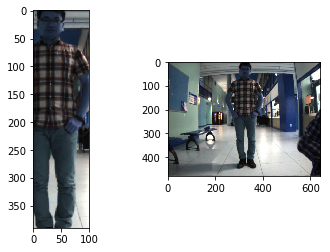

Epoch 1/1
80/80 [==============================] - 0s 120us/step - loss: 0.0066 - acc: 1.0000
119
depth of current image  1.141298322282666
depth of previous image  1.141757935910867
31282
0.8021025641025641
predicted_value  [0.99990654]
cordis are  [18, 291]


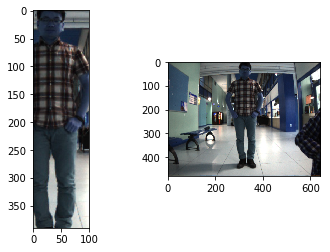

Epoch 1/1
80/80 [==============================] - 0s 123us/step - loss: 0.0190 - acc: 1.0000
120
depth of current image  1.1423040170014098
depth of previous image  1.141298322282666
31333
0.8034102564102564
predicted_value  [0.9998584]
cordis are  [18, 291]


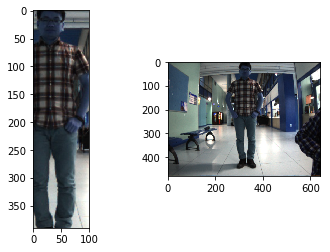

Epoch 1/1
80/80 [==============================] - 0s 122us/step - loss: 0.0164 - acc: 1.0000
121
depth of current image  1.1411309074409177
depth of previous image  1.1423040170014098
31243
0.8011025641025641
predicted_value  [0.9999244]
cordis are  [18, 291]


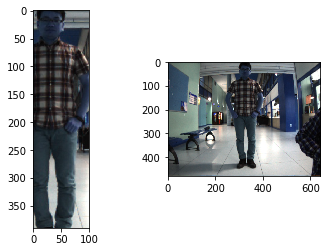

Epoch 1/1
80/80 [==============================] - 0s 114us/step - loss: 0.0072 - acc: 1.0000
122
depth of current image  1.1457020509352422
depth of previous image  1.1411309074409177
31142
0.7985128205128205
predicted_value  [0.99985445]
cordis are  [18, 291]


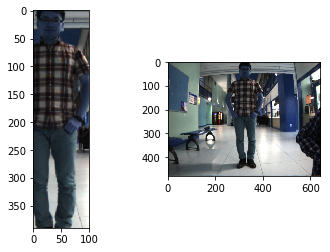

Epoch 1/1
80/80 [==============================] - 0s 113us/step - loss: 0.0137 - acc: 0.9875
123
depth of current image  1.1431208624928564
depth of previous image  1.1457020509352422
31218
0.8004615384615384
predicted_value  [0.99989295]
cordis are  [18, 291]


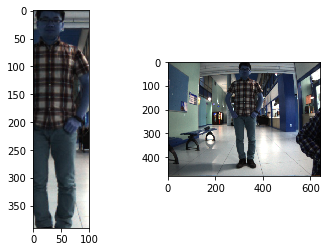

Epoch 1/1
80/80 [==============================] - 0s 128us/step - loss: 0.0017 - acc: 1.0000
124
depth of current image  1.1449246459781903
depth of previous image  1.1431208624928564
30986
0.7945128205128205
predicted_value  [0.9991825]
cordis are  [18, 291]


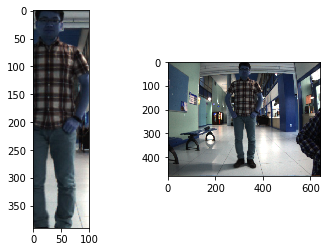

Epoch 1/1
80/80 [==============================] - 0s 178us/step - loss: 0.0337 - acc: 0.9875
125
depth of current image  1.1511485178527197
depth of previous image  1.1449246459781903
30661
0.7861794871794872
predicted_value  [0.99799085]
cordis are  [23, 286]


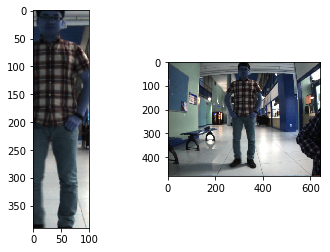

Epoch 1/1
80/80 [==============================] - 0s 119us/step - loss: 0.0259 - acc: 0.9875
126
depth of current image  1.152215386960684
depth of previous image  1.1511485178527197
31641
0.8113076923076923
predicted_value  [0.9919592]
cordis are  [23, 286]


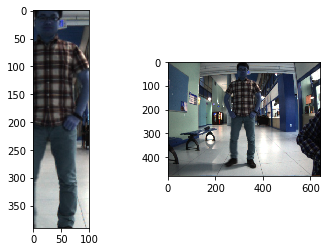

Epoch 1/1
80/80 [==============================] - 0s 127us/step - loss: 0.0466 - acc: 0.9625
127
depth of current image  1.1512090527224899
depth of previous image  1.152215386960684
29464
0.7554871794871795
predicted_value  [0.98071057]
cordis are  [18, 276]


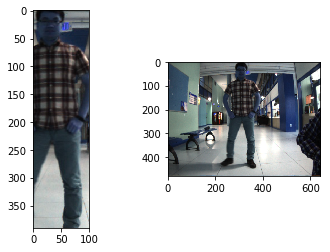

Epoch 1/1
80/80 [==============================] - 0s 124us/step - loss: 0.0240 - acc: 0.9875
128
depth of current image  1.1445621367105838
depth of previous image  1.1512090527224899
29783
0.7636666666666667
predicted_value  [0.97901034]
cordis are  [18, 271]


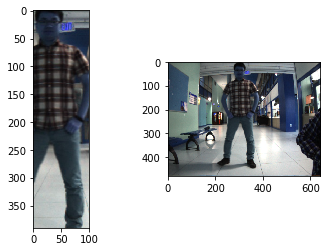

Epoch 1/1
80/80 [==============================] - 0s 137us/step - loss: 0.0209 - acc: 0.9875
129
depth of current image  1.148887762479096
depth of previous image  1.1445621367105838
28316
0.726051282051282
predicted_value  [0.9955623]
cordis are  [18, 261]


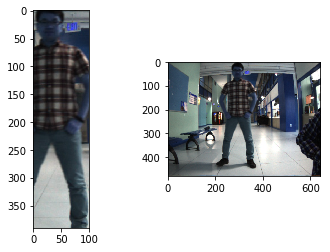

Epoch 1/1
80/80 [==============================] - 0s 117us/step - loss: 0.0185 - acc: 1.0000
130
depth of current image  1.1579534270832892
depth of previous image  1.148887762479096
28570
0.7325641025641025
predicted_value  [0.9894526]
cordis are  [18, 246]


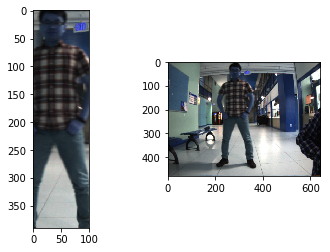

Epoch 1/1
80/80 [==============================] - 0s 119us/step - loss: 0.0536 - acc: 0.9750
131
depth of current image  1.1751263456834826
depth of previous image  1.1579534270832892
29845
0.7652564102564102
predicted_value  [0.99700195]
cordis are  [8, 236]


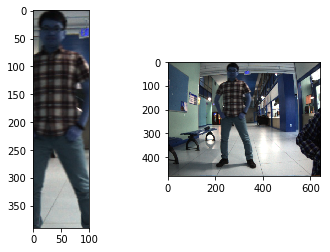

Epoch 1/1
80/80 [==============================] - 0s 134us/step - loss: 0.0048 - acc: 1.0000
132
depth of current image  1.2049150254404855
depth of previous image  1.1751263456834826
29044
0.7447179487179487
predicted_value  [0.99969065]
cordis are  [23, 221]


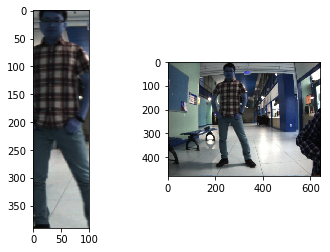

Epoch 1/1
80/80 [==============================] - 0s 127us/step - loss: 0.0669 - acc: 0.9875
133
depth of current image  1.2179086012363682
depth of previous image  1.2049150254404855
32755
0.8398717948717949
predicted_value  [0.9997961]
cordis are  [23, 216]


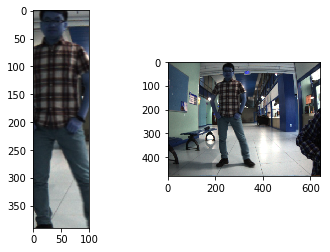

Epoch 1/1
80/80 [==============================] - 0s 124us/step - loss: 0.0254 - acc: 0.9875
134
depth of current image  1.2250918620318343
depth of previous image  1.2179086012363682
33266
0.852974358974359
predicted_value  [0.99900585]
cordis are  [23, 216]


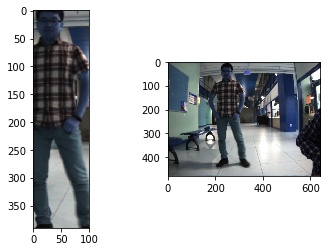

Epoch 1/1
80/80 [==============================] - 0s 120us/step - loss: 0.0164 - acc: 1.0000
135
depth of current image  1.2265515977017467
depth of previous image  1.2250918620318343
32567
0.8350512820512821
predicted_value  [0.99940526]
cordis are  [18, 211]


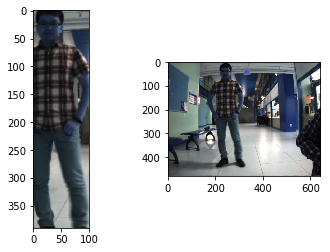

Epoch 1/1
80/80 [==============================] - 0s 123us/step - loss: 0.0076 - acc: 1.0000
136
depth of current image  1.2325726444060918
depth of previous image  1.2265515977017467
32065
0.8221794871794872
predicted_value  [0.99991393]
cordis are  [18, 206]


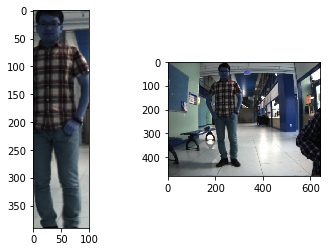

Epoch 1/1
80/80 [==============================] - 0s 120us/step - loss: 0.0577 - acc: 0.9750
137
depth of current image  1.2351566871596646
depth of previous image  1.2325726444060918
32273
0.8275128205128205
predicted_value  [0.9999279]
cordis are  [23, 201]


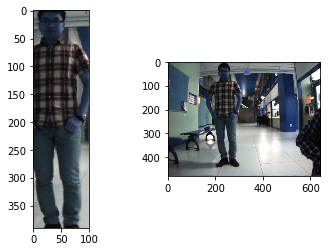

Epoch 1/1
80/80 [==============================] - 0s 114us/step - loss: 0.1180 - acc: 0.9875
138
depth of current image  1.2372941140218947
depth of previous image  1.2351566871596646
32453
0.8321282051282052
predicted_value  [0.999974]
cordis are  [18, 206]


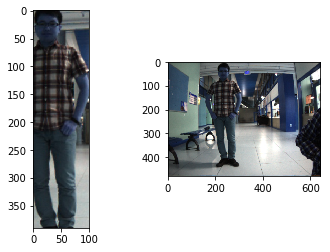

Epoch 1/1
80/80 [==============================] - 0s 113us/step - loss: 0.0394 - acc: 0.9750
139
depth of current image  1.242322540412574
depth of previous image  1.2372941140218947
30015
0.7696153846153846
predicted_value  [0.99869055]
cordis are  [13, 201]


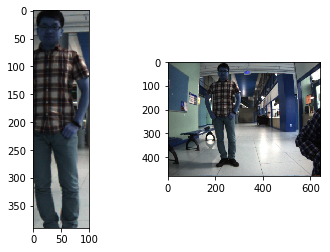

Epoch 1/1
80/80 [==============================] - 0s 117us/step - loss: 0.0284 - acc: 0.9875
140
depth of current image  1.2436150101025085
depth of previous image  1.242322540412574
30773
0.789051282051282
predicted_value  [0.99731404]
cordis are  [18, 201]


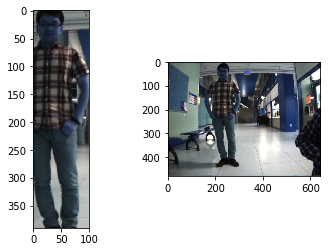

Epoch 1/1
80/80 [==============================] - 0s 121us/step - loss: 0.0595 - acc: 0.9625
141
depth of current image  1.2446472217696343
depth of previous image  1.2436150101025085
30685
0.7867948717948718
predicted_value  [0.99805236]
cordis are  [18, 196]


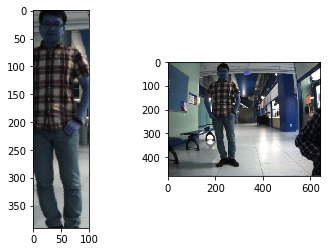

Epoch 1/1
80/80 [==============================] - 0s 116us/step - loss: 0.0188 - acc: 1.0000
142
depth of current image  1.2460127539156853
depth of previous image  1.2446472217696343
31243
0.8011025641025641
predicted_value  [0.9980202]
cordis are  [18, 196]


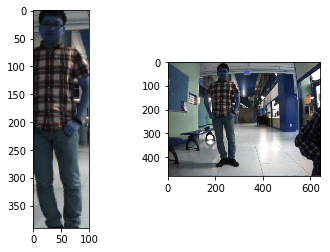

Epoch 1/1
80/80 [==============================] - 0s 190us/step - loss: 0.0080 - acc: 1.0000
143
depth of current image  1.2468383881130336
depth of previous image  1.2460127539156853
31275
0.801923076923077
predicted_value  [0.999561]
cordis are  [18, 196]


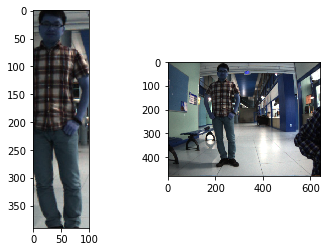

Epoch 1/1
80/80 [==============================] - 0s 158us/step - loss: 0.0189 - acc: 0.9875
144
depth of current image  1.2480997937379155
depth of previous image  1.2468383881130336
31057
0.7963333333333333
predicted_value  [0.9994842]
cordis are  [18, 191]


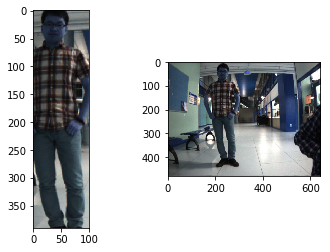

Epoch 1/1
80/80 [==============================] - 0s 129us/step - loss: 0.0616 - acc: 0.9875
145
depth of current image  1.2519518305392303
depth of previous image  1.2480997937379155
31863
0.817
predicted_value  [0.9995666]
cordis are  [18, 191]


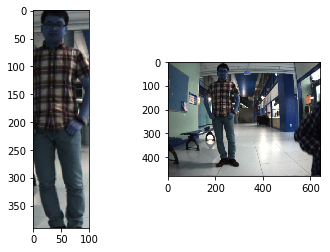

Epoch 1/1
80/80 [==============================] - 0s 129us/step - loss: 0.0231 - acc: 0.9875
146
depth of current image  1.2479749125735204
depth of previous image  1.2519518305392303
31926
0.8186153846153846
predicted_value  [0.9994037]
cordis are  [18, 191]


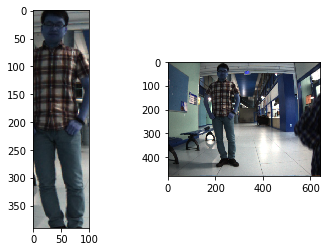

Epoch 1/1
80/80 [==============================] - 0s 119us/step - loss: 0.0348 - acc: 0.9875
147
depth of current image  1.250381993865054
depth of previous image  1.2479749125735204
31699
0.8127948717948718
predicted_value  [0.9989956]
cordis are  [18, 191]


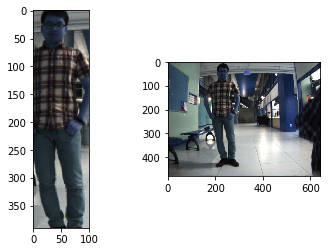

Epoch 1/1
80/80 [==============================] - 0s 157us/step - loss: 0.0069 - acc: 1.0000
148
depth of current image  1.249741081016561
depth of previous image  1.250381993865054
32045
0.8216666666666667
predicted_value  [0.99828833]
cordis are  [18, 196]


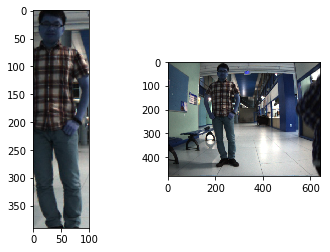

Epoch 1/1
80/80 [==============================] - 0s 136us/step - loss: 0.0263 - acc: 0.9875
149
depth of current image  1.2481513761381806
depth of previous image  1.249741081016561
31249
0.8012564102564103
predicted_value  [0.9975205]
cordis are  [18, 196]


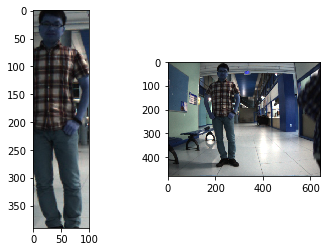

Epoch 1/1
80/80 [==============================] - 0s 121us/step - loss: 0.0265 - acc: 1.0000
150
depth of current image  1.2513430029546058
depth of previous image  1.2481513761381806
31536
0.8086153846153846
predicted_value  [0.9979948]
cordis are  [18, 196]


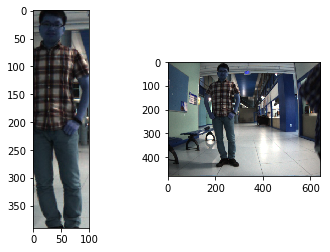

Epoch 1/1
80/80 [==============================] - 0s 121us/step - loss: 0.0140 - acc: 1.0000
151
depth of current image  1.2500019733763543
depth of previous image  1.2513430029546058
31299
0.8025384615384615
predicted_value  [0.9988778]
cordis are  [18, 196]


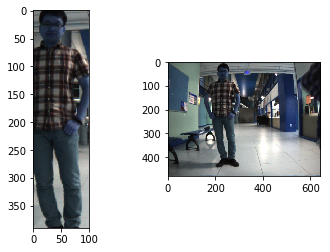

Epoch 1/1
80/80 [==============================] - 0s 122us/step - loss: 0.0909 - acc: 0.9875
152
depth of current image  1.2464117008203457
depth of previous image  1.2500019733763543
31306
0.8027179487179488
predicted_value  [0.99980325]
cordis are  [18, 196]


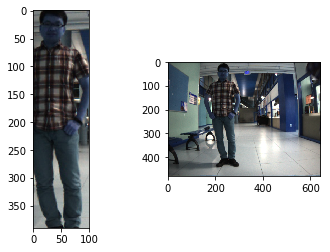

Epoch 1/1
80/80 [==============================] - 0s 118us/step - loss: 0.0173 - acc: 0.9875
153
depth of current image  1.2489423819480043
depth of previous image  1.2464117008203457
31230
0.8007692307692308
predicted_value  [0.99984384]
cordis are  [18, 196]


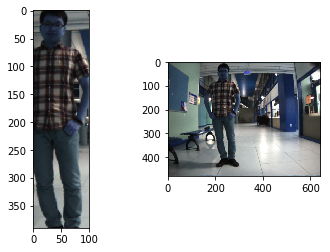

Epoch 1/1
80/80 [==============================] - 0s 133us/step - loss: 0.0115 - acc: 1.0000
154
depth of current image  1.2536221659475275
depth of previous image  1.2489423819480043
31684
0.8124102564102564
predicted_value  [0.9998084]
cordis are  [18, 201]


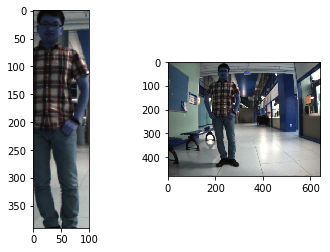

Epoch 1/1
80/80 [==============================] - 0s 126us/step - loss: 0.0024 - acc: 1.0000
155
depth of current image  1.2497078758510751
depth of previous image  1.2536221659475275
30688
0.7868717948717948
predicted_value  [0.9998697]
cordis are  [18, 196]


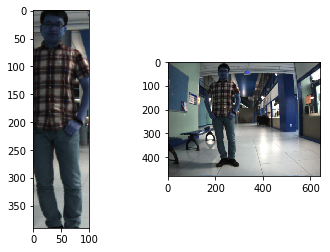

Epoch 1/1
80/80 [==============================] - 0s 118us/step - loss: 0.0089 - acc: 1.0000
156
depth of current image  1.2488100838219949
depth of previous image  1.2497078758510751
31762
0.8144102564102564
predicted_value  [0.99984884]
cordis are  [18, 196]


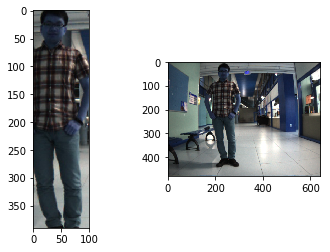

Epoch 1/1
80/80 [==============================] - 0s 108us/step - loss: 0.0026 - acc: 1.0000
157
depth of current image  1.2515890556983011
depth of previous image  1.2488100838219949
32337
0.8291538461538461
predicted_value  [0.9999281]
cordis are  [18, 201]


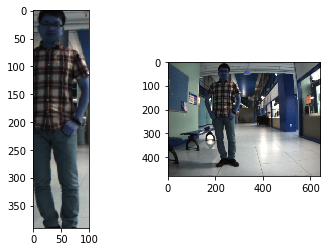

Epoch 1/1
80/80 [==============================] - 0s 129us/step - loss: 0.0555 - acc: 0.9875
158
depth of current image  1.2446157128677076
depth of previous image  1.2515890556983011
31705
0.8129487179487179
predicted_value  [0.9999269]
cordis are  [18, 201]


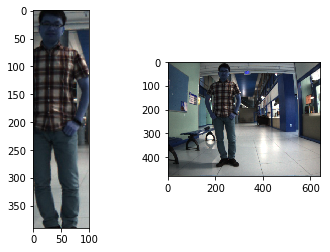

Epoch 1/1
80/80 [==============================] - 0s 122us/step - loss: 0.0072 - acc: 1.0000
159
depth of current image  1.2448282524688592
depth of previous image  1.2446157128677076
32880
0.8430769230769231
predicted_value  [0.99994826]
cordis are  [18, 201]


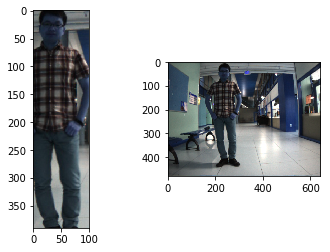

Epoch 1/1
80/80 [==============================] - 0s 118us/step - loss: 0.0369 - acc: 0.9875
160
depth of current image  1.2477773629121616
depth of previous image  1.2448282524688592
34187
0.8765897435897436
predicted_value  [0.9999629]
cordis are  [23, 206]


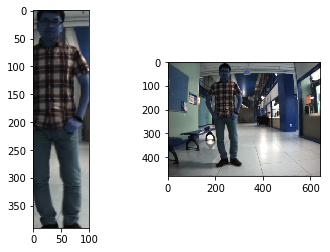

Epoch 1/1
80/80 [==============================] - 0s 122us/step - loss: 0.0606 - acc: 0.9875
161
depth of current image  1.2506314308041273
depth of previous image  1.2477773629121616
34399
0.8820256410256411
predicted_value  [0.9999546]
cordis are  [23, 206]


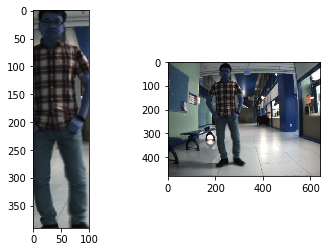

Epoch 1/1
80/80 [==============================] - 0s 115us/step - loss: 0.0137 - acc: 1.0000
162
depth of current image  1.252924084135541
depth of previous image  1.2506314308041273
34071
0.8736153846153846
predicted_value  [0.99997723]
cordis are  [23, 216]


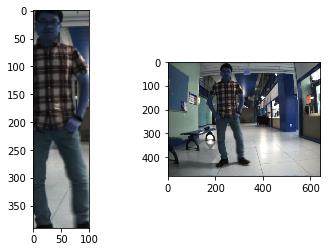

Epoch 1/1
80/80 [==============================] - 0s 117us/step - loss: 0.0642 - acc: 0.9750
163
depth of current image  1.252542231025591
depth of previous image  1.252924084135541
33736
0.8650256410256411
predicted_value  [0.9999857]
cordis are  [23, 216]


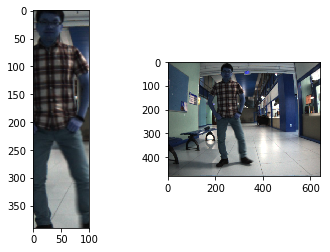

Epoch 1/1
80/80 [==============================] - 0s 116us/step - loss: 0.0491 - acc: 0.9875
164
depth of current image  1.2443410170130245
depth of previous image  1.252542231025591
31799
0.8153589743589743
predicted_value  [0.99968874]
cordis are  [23, 221]


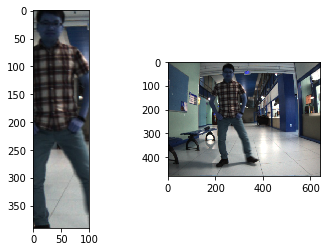

Epoch 1/1
80/80 [==============================] - 0s 126us/step - loss: 0.0770 - acc: 0.9750
165
depth of current image  1.2372484681963882
depth of previous image  1.2443410170130245
31129
0.7981794871794872
predicted_value  [0.99848074]
cordis are  [18, 231]


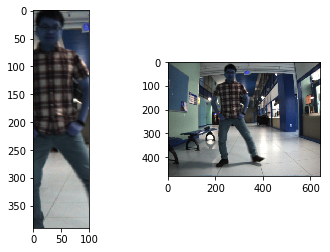

Epoch 1/1
80/80 [==============================] - 0s 114us/step - loss: 0.0099 - acc: 1.0000
166
depth of current image  1.221806765002099
depth of previous image  1.2372484681963882
29596
0.7588717948717949
predicted_value  [0.99497837]
cordis are  [23, 241]


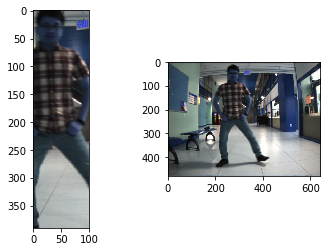

Epoch 1/1
80/80 [==============================] - 0s 129us/step - loss: 0.0302 - acc: 1.0000
167
depth of current image  1.1877857711206439
depth of previous image  1.221806765002099
28606
0.7334871794871795
predicted_value  [0.997375]
cordis are  [23, 266]


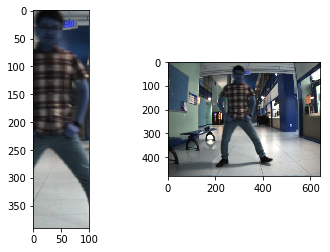

Epoch 1/1
80/80 [==============================] - 0s 125us/step - loss: 0.0479 - acc: 0.9750
168
depth of current image  1.1847554019453697
depth of previous image  1.1877857711206439
27614
0.7080512820512821
predicted_value  [0.999912]
cordis are  [23, 281]


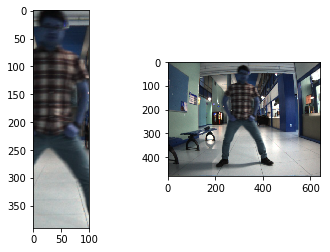

Epoch 1/1
80/80 [==============================] - 0s 129us/step - loss: 0.0048 - acc: 1.0000
169
depth of current image  1.185887889076077
depth of previous image  1.1847554019453697
28257
0.7245384615384616
predicted_value  [0.99837756]
cordis are  [23, 301]


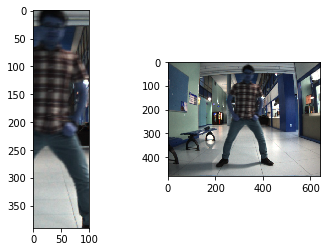

Epoch 1/1
80/80 [==============================] - 0s 126us/step - loss: 0.0076 - acc: 1.0000
170
depth of current image  1.2016862206881187
depth of previous image  1.185887889076077
26924
0.6903589743589743
predicted_value  [0.9999634]
cordis are  [23, 316]


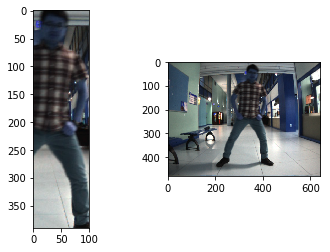

Epoch 1/1
80/80 [==============================] - 0s 128us/step - loss: 0.0054 - acc: 1.0000
171
depth of current image  1.218148811521381
depth of previous image  1.2016862206881187
29423
0.7544358974358975
predicted_value  [0.99978715]
cordis are  [18, 331]


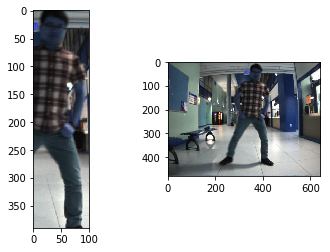

Epoch 1/1
80/80 [==============================] - 0s 124us/step - loss: 0.0149 - acc: 0.9875
172
depth of current image  1.2381359342524136
depth of previous image  1.218148811521381
28790
0.7382051282051282
predicted_value  [0.99995685]
cordis are  [18, 341]


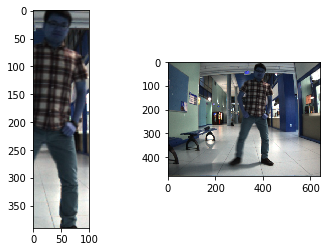

Epoch 1/1
80/80 [==============================] - 0s 127us/step - loss: 0.0129 - acc: 0.9875
173
depth of current image  1.2540056824160803
depth of previous image  1.2381359342524136
27917
0.7158205128205128
predicted_value  [0.99995613]
cordis are  [23, 351]


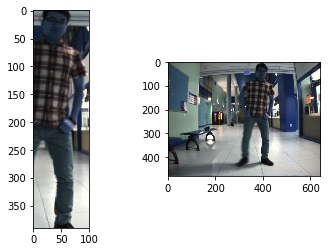

Epoch 1/1
80/80 [==============================] - 0s 117us/step - loss: 0.0371 - acc: 0.9875
174
depth of current image  1.2733335967770225
depth of previous image  1.2540056824160803
28589
0.733051282051282
predicted_value  [0.9999385]
cordis are  [23, 351]


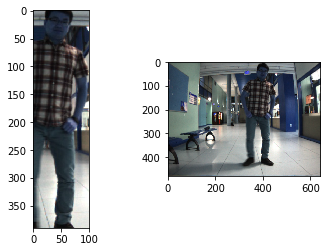

Epoch 1/1
80/80 [==============================] - 0s 122us/step - loss: 0.0852 - acc: 0.9750
175
depth of current image  1.2779592158478437
depth of previous image  1.2733335967770225
29103
0.7462307692307693
predicted_value  [0.9995721]
cordis are  [23, 356]


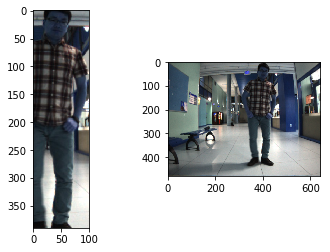

Epoch 1/1
80/80 [==============================] - 0s 132us/step - loss: 0.0371 - acc: 0.9875
176
depth of current image  1.2882822999301058
depth of previous image  1.2779592158478437
28569
0.7325384615384616
predicted_value  [0.99951994]
cordis are  [23, 361]


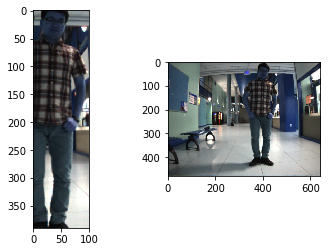

Epoch 1/1
80/80 [==============================] - 0s 114us/step - loss: 0.0334 - acc: 0.9875
177
depth of current image  1.2970371378274272
depth of previous image  1.2882822999301058
27668
0.7094358974358974
predicted_value  [0.9972994]
cordis are  [13, 366]


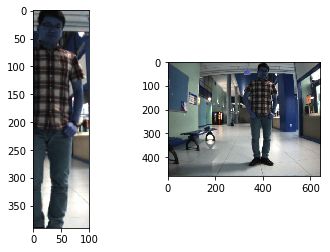

Epoch 1/1
80/80 [==============================] - 0s 129us/step - loss: 0.1317 - acc: 0.9375
178
depth of current image  1.295545063817181
depth of previous image  1.2970371378274272
26127
0.669923076923077
predicted_value  [0.9999716]
cordis are  [18, 366]


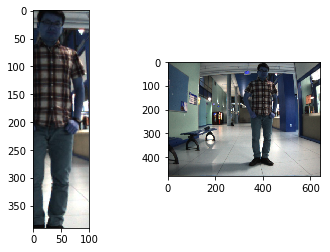

Epoch 1/1
80/80 [==============================] - 0s 115us/step - loss: 0.0666 - acc: 0.9750
179
depth of current image  1.3010078880104345
depth of previous image  1.295545063817181
26742
0.6856923076923077
predicted_value  [0.9999914]
cordis are  [18, 366]


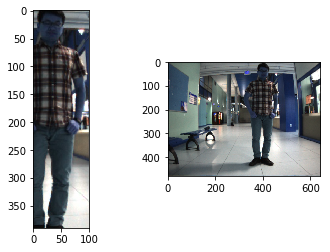

Epoch 1/1
80/80 [==============================] - 0s 128us/step - loss: 0.1307 - acc: 0.9625
180
depth of current image  1.3002955934114013
depth of previous image  1.3010078880104345
26706
0.6847692307692308
predicted_value  [0.99996984]
cordis are  [13, 371]


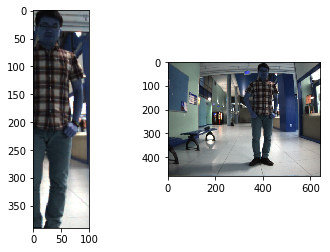

Epoch 1/1
80/80 [==============================] - 0s 119us/step - loss: 0.1010 - acc: 0.9625
181
depth of current image  1.300641555701252
depth of previous image  1.3002955934114013
24756
0.6347692307692308
predicted_value  [0.9999819]
cordis are  [13, 371]


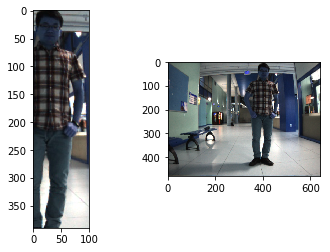

Epoch 1/1
80/80 [==============================] - 0s 126us/step - loss: 0.0018 - acc: 1.0000
182
depth of current image  1.302686073827481
depth of previous image  1.300641555701252
24915
0.6388461538461538
predicted_value  [0.9999385]
cordis are  [13, 371]


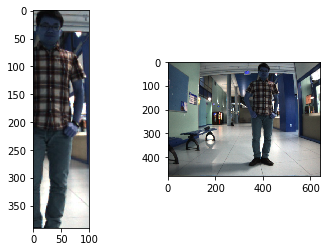

Epoch 1/1
80/80 [==============================] - 0s 125us/step - loss: 0.0349 - acc: 0.9875
183
depth of current image  1.301774518119332
depth of previous image  1.302686073827481
24759
0.6348461538461538
predicted_value  [0.99988174]
cordis are  [13, 371]


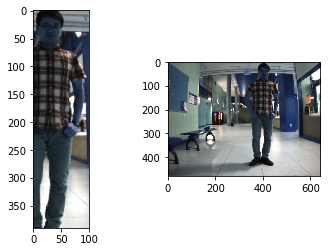

Epoch 1/1
80/80 [==============================] - 0s 134us/step - loss: 0.0082 - acc: 1.0000
184
depth of current image  1.3008801827250602
depth of previous image  1.301774518119332
24801
0.6359230769230769
predicted_value  [0.99901056]
cordis are  [13, 371]


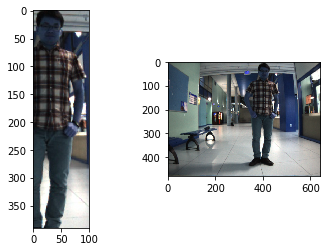

Epoch 1/1
80/80 [==============================] - 0s 128us/step - loss: 0.1299 - acc: 0.9375
185
depth of current image  1.3030956768248978
depth of previous image  1.3008801827250602
25119
0.6440769230769231
predicted_value  [0.99993265]
cordis are  [13, 371]


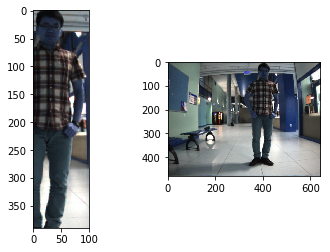

Epoch 1/1
80/80 [==============================] - 0s 122us/step - loss: 0.0051 - acc: 1.0000
186
depth of current image  1.301451403826444
depth of previous image  1.3030956768248978
24740
0.6343589743589744
predicted_value  [0.9999926]
cordis are  [13, 371]


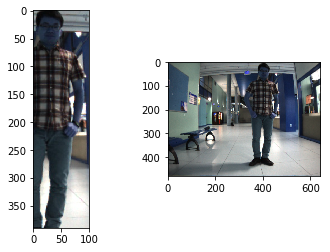

Epoch 1/1
80/80 [==============================] - 0s 136us/step - loss: 0.0327 - acc: 0.9875
187
depth of current image  1.2990367840439547
depth of previous image  1.301451403826444
24715
0.6337179487179487
predicted_value  [0.99999654]
cordis are  [13, 371]


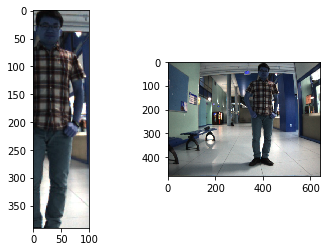

Epoch 1/1
80/80 [==============================] - 0s 127us/step - loss: 0.0867 - acc: 0.9750
188
depth of current image  1.2986726146690732
depth of previous image  1.2990367840439547
24790
0.6356410256410256
predicted_value  [0.9999944]
cordis are  [13, 371]


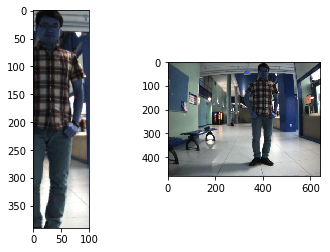

Epoch 1/1
80/80 [==============================] - 0s 125us/step - loss: 0.1311 - acc: 0.9625
189
depth of current image  1.303214928483435
depth of previous image  1.2986726146690732
25033
0.6418717948717949
predicted_value  [0.9999931]
cordis are  [13, 371]


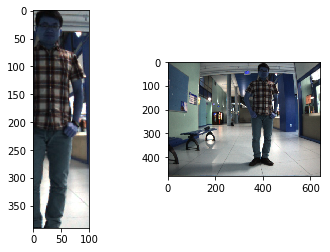

Epoch 1/1
80/80 [==============================] - 0s 127us/step - loss: 0.0035 - acc: 1.0000
190
depth of current image  1.3059010671793687
depth of previous image  1.303214928483435
25146
0.6447692307692308
predicted_value  [0.999985]
cordis are  [8, 371]


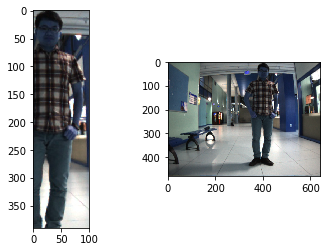

Epoch 1/1
80/80 [==============================] - 0s 132us/step - loss: 0.0119 - acc: 1.0000
191
depth of current image  1.302081976482011
depth of previous image  1.3059010671793687
24466
0.6273333333333333
predicted_value  [0.9999609]
cordis are  [8, 371]


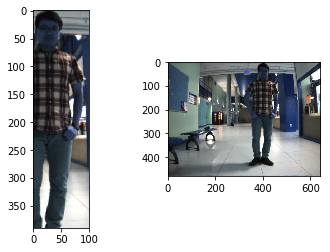

Epoch 1/1
80/80 [==============================] - 0s 125us/step - loss: 0.0679 - acc: 0.9875
192
depth of current image  1.3024858114403488
depth of previous image  1.302081976482011
24305
0.6232051282051282
predicted_value  [0.99994266]
cordis are  [13, 366]


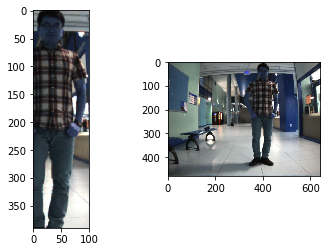

Epoch 1/1
80/80 [==============================] - 0s 123us/step - loss: 0.0015 - acc: 1.0000
193
depth of current image  1.297211105995605
depth of previous image  1.3024858114403488
26576
0.6814358974358974
predicted_value  [0.99992955]
cordis are  [18, 366]


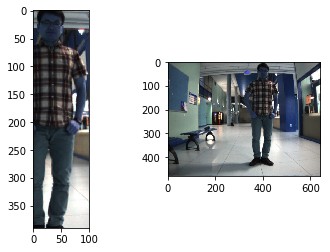

Epoch 1/1
80/80 [==============================] - 0s 122us/step - loss: 0.0026 - acc: 1.0000
194
depth of current image  1.3017946310255306
depth of previous image  1.297211105995605
26812
0.6874871794871795
predicted_value  [0.99995697]
cordis are  [23, 366]


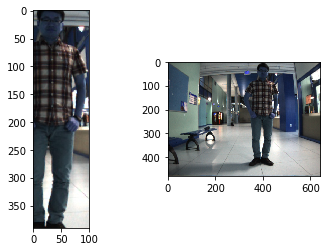

Epoch 1/1
80/80 [==============================] - 0s 116us/step - loss: 0.0140 - acc: 1.0000
195
depth of current image  1.2926310699881682
depth of previous image  1.3017946310255306
26765
0.6862820512820513
predicted_value  [0.99997747]
cordis are  [18, 366]


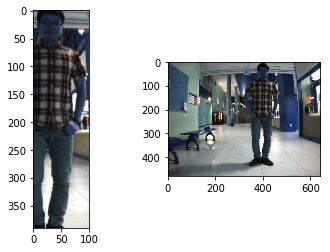

Epoch 1/1
80/80 [==============================] - 0s 115us/step - loss: 0.0274 - acc: 0.9875
196
depth of current image  1.2929127231680304
depth of previous image  1.2926310699881682
26421
0.6774615384615384
predicted_value  [0.9999764]
cordis are  [18, 366]


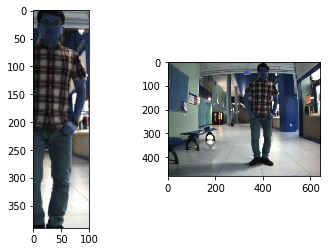

Epoch 1/1
80/80 [==============================] - 0s 118us/step - loss: 0.0119 - acc: 1.0000
197
depth of current image  1.28768548165771
depth of previous image  1.2929127231680304
25720
0.6594871794871795
predicted_value  [0.99996734]
cordis are  [18, 361]


In [0]:
new_cordis = cordis[0]
for i in range(1, 700):
  print(i)
  color_img = cv2.imread("hallway_1/left/" + image_files[i])
  depth_img = cv2.imread("hallway_1/depth/" + depth_files[i])
  img = np.concatenate([color_img, depth_img], axis = 2)
  img = img[:, :, :4]
  depth = alpha_value(img[:,:,3],new_cordis[0],new_cordis[1], pre_depth)
  print("depth of current image ", depth)
  print("depth of previous image ", pre_depth)
  if(depth < pre_depth + .3 and depth > pre_depth - .3):
    pre_depth = depth
  list_x = []
  one_in_all(img[:, :, 3],new_cordis[0],new_cordis[1],pre_depth)
  #print(list_x)
  if(list_x == []):
    print("\n\n\n")
    continue
  predictions = [] 
  for u in range(len(list_x)):
    x1 = list_x[u][0]
    y1 = list_x[u][1]
    p = img[x1:x1+h, y1:y1+w, :]
    p = np.asarray(p)
    p = cv2.resize(p, (28, 28))
    p = np.resize(p , (1,28,28,4))
    predictions.append(cnn_v1.predict(p)[0])
  #print("predictions ", predictions)
  #print("number of sliding_window ", len(list_x))
  index = predictions.index(max(predictions))
  print("predicted_value ", predictions[index])
  new_cordis = list_x[index]
  print("cordis are ", new_cordis)
  images.append(img)
  cordis.append(new_cordis)
  patch_1 = img[new_cordis[0]:new_cordis[0]+h, new_cordis[1]:new_cordis[1]+w, :]
  patch_1_global.append(patch_1)
  patch_rev = patch_1_global
  patch_rev.reverse()
  f, axrr = plt.subplots(1, 2)
  axrr[0].imshow(patch_1[:, :, :3])
  axrr[1].imshow(img[:, :, :3])
  plt.show()
  x_train = []
  for i in range(40):
    #x = randint(0, len(cordis)-1)
    #x_train.append(np.asarray(cv2.resize(random_patch(cordis[x][0], cordis[x][1], h, w, images[x]), (28, 28))))
    x_train.append(np.asarray(cv2.resize(random_patch(new_cordis[0], new_cordis[1], h, w, img), (28, 28))))

  for i in range(40):
    x = 0
    if(len(patch_rev) < 16):
      x = randint(0, len(patch_rev)-1)
    else:
      x = randint(0, 15)
    x_train.append(np.asarray(cv2.resize(patch_rev[x], (28, 28))))
  x_train = np.asarray(x_train)
  y_train = np.zeros(80)
  y_train[40:] = np.ones(40)
  cnn_v1.fit(x_train, y_train, epochs = 1, batch_size = 80, shuffle = True)
 

In [0]:
i = 44
new_cordis = [83, 261]
prea_depth = 1.1588263390056666


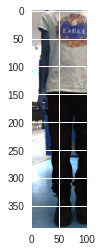

In [0]:
depth_img = cv2.imread("hallway_1/left/left00000044.jpg")[83:83+390, 261:361]
plt.imshow(depth_img)
plt.show()
#one_in_all(depth_img, 17, 252, 1.1355305204679682)
#print(list_x)

In [0]:
i

44

In [0]:
color_img = cv2.imread("lecture_hall/left/" + image_files[i])
depth_img = cv2.imread("lecture_hall/depth/" + depth_files[i])
img = np.concatenate([color_img, depth_img], axis = 2)
img = img[:, :, :4]
depth = alpha_value(img[:,:,3],new_cordis[0],new_cordis[1], pre_depth)
print("cordis are ", new_cordis)
print("depth of current image ", depth)
print("depth of previous image ", pre_depth)
if(depth < pre_depth + .3 and depth > pre_depth - .3):
  pre_depth = depth
list_x = []
print("pre_depth ", pre_depth)
one_in_all(img[:, :, 3],new_cordis[0],new_cordis[1],pre_depth)
predictions = [] 
print("number of sliding_window ", list_x)
for i in range(len(list_x)):
  x1 = list_x[i][0]
  y1 = list_x[i][1]
  p = img[x1:x1+h, y1:y1+w, :]
  p = np.asarray(p)
  p = np.resize(p , (1,28,28,4))
d  predictions.append(cnn_v1.predict(p)[0])
index = predictions.index(max(predictions))
print("predicted_value ", predictions[index])

SyntaxError: ignored

In [0]:
depth_files[i]

In [0]:
depth_files